# Capstone Project on walmart


# a. Problem Statement -
 A retail store that has multiple outlets across the country are facing issues in managing the inventory - to match the demand with respect to supply. You are a data scientist, who has to come up with useful insights using the data and make prediction models to forecast the sales for X number of months/years.


# b. Project Objective -
1- Using the above data, come up with useful insights that can be used by each of the stores to improve in various areas.

2- Forecast the sales for each store for the next 12 weeks.


# c. Data Description -
1- Store - Store number 

2- Date -  Week of Sales 

3- Weekly_Sales - Sales for the given store in that week 

4- Holiday_Flag - If it is a holiday week 

5- Temperature - Temperature on the day of the sale 

6- Fuel_Price - Cost of the fuel in the region 

7- CPI - Consumer Price Index 

8- Unemployment - Unemployment Rate

# d. Data Pre-processing Steps and Inspiration -
1- Importing all the necessary libraries.

2- Import CSV files by using read_csv( ) function from the pandas package.

3- Check data information with various codes.

4- Check the null values.

5-Doing EDA and feature engineering on given data.

6- Perform data visualization for better understanding.

# Choosing the Algorithm for the Project - 
In this time series forecasting project I am applying two algorithm 
1- ARIMA Models 

2- SARIMA models 


# Motivation and Reasons For Choosing the Algorithm &  Model Evaluation and Techniques -
1- ARIMA Models stands for AutoRegressive Integrated Moving Average.

2- SARIMA stands for Seasonal AutoRegressive Integrated Moving Average.

Time series data can be effectively captured by both models for trends and seasonality; however, Sarima is more appropriate for data that exhibit more intricate seasonal patterns.

# Assumptions - 
1- The data is statinary and accurate.

2- Seasonality is important factor in this data so it cant be avoided and it will be continue in the future also so by keeping this in mind algorithm is chosen. 

# Inferences from the Same -
1- Weekly sales are effected by unemployment, and mostly the stores 32 and 40

2- Seasonality is a major factor as sales are been affected by seasons such as festival times highest number of sales can be seen.

3- There is a high variance in weekly sales from one store to another store. Store No. 20 has the highest sales from any store and Store No. 33 comes last.

4- Weekly sales are low during summer and winter season.
5-  When compared between holiday week vs non – holiday week it clearly visible that sales are increased in holiday week compared to non – holiday week.

# Future Possibilities of the Project -
1- In Holidays come up with more discounts and schemes or entertainment activities for children to visit store.
2- Corrective measure should be taken for stores showing worst performance.
3- Sales are high during festivals season so start campaign regarding for gifts and launched various games related to product and winner will get assured prize.


In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


In [88]:
df=pd.read_csv(r'C:\Users\Administrator\Documents\Walmart DataSet (1).csv')


In [89]:
# cheking first 10 rows data
df.head(10)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
5,1,12-03-2010,1439541.59,0,57.79,2.667,211.380643,8.106
6,1,19-03-2010,1472515.79,0,54.58,2.720,211.215635,8.106
7,1,26-03-2010,1404429.92,0,51.45,2.732,211.018042,8.106
8,1,02-04-2010,1594968.28,0,62.27,2.719,210.820450,7.808
9,1,09-04-2010,1545418.53,0,65.86,2.770,210.622857,7.808


In [90]:
# Cheking last 10 rows data.
df.tail(10)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6425,45,24-08-2012,718232.26,0,72.62,3.834,191.344887,8.684
6426,45,31-08-2012,734297.87,0,75.09,3.867,191.461281,8.684
6427,45,07-09-2012,766512.66,1,75.70,3.911,191.577676,8.684
6428,45,14-09-2012,702238.27,0,67.87,3.948,191.699850,8.684
6429,45,21-09-2012,723086.20,0,65.32,4.038,191.856704,8.684
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,26-10-2012,760281.43,0,58.85,3.882,192.308899,8.667


In [43]:
# Cheking how much Rows and Columns are present in dataset. 
df.shape

(6435, 8)

In [91]:
# It will give insightfull result about data like total counts, null counts, type of data,columns name.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [45]:
# We will check te missing value in dataset
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

There is No missing value in this dataset.

In [46]:
# Check Duplicate Values
df.duplicated().sum()

0

There is No duplicate value present in this dataset.

In [92]:
#  Now we will apply mathematical operation to find count,mean,std,min,max,25%,50%,75% of data.
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [8]:
store_nos=df['Store'].unique()
store_nos

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

In [96]:
# Convert Date dataype object to datetime.
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')


In [97]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


In [51]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [ ]:
If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?

In [52]:
correlation_results = []
for store_number in df['Store'].unique():
    store_data = df[df['Store']==store_number]
    corr_data = store_data['Weekly_Sales'].corr(store_data['Unemployment'])
    corr_df = print(f"Store {store_number}: Correlation = {corr_data}")

Store 1: Correlation = -0.09795539472957951
Store 2: Correlation = 0.06632485967770844
Store 3: Correlation = -0.23041301348635257
Store 4: Correlation = -0.33701519564455884
Store 5: Correlation = -0.20704271031605842
Store 6: Correlation = 0.044250821015624074
Store 7: Correlation = -0.16538168270129613
Store 8: Correlation = -0.0525796461971268
Store 9: Correlation = -0.191534363702284
Store 10: Correlation = 0.1319076220774609
Store 11: Correlation = -0.020338971133082327
Store 12: Correlation = -0.009286099902746573
Store 13: Correlation = -0.17163286889635032
Store 14: Correlation = 0.2107864829459359
Store 15: Correlation = 0.0789053686051427
Store 16: Correlation = -0.07086358405192239
Store 17: Correlation = -0.2635996818307391
Store 18: Correlation = 0.13917900226669455
Store 19: Correlation = 0.10146392090273447
Store 20: Correlation = -0.09534134450284634
Store 21: Correlation = 0.21836733305703382
Store 22: Correlation = 0.0390428673553475
Store 23: Correlation = -0.077168

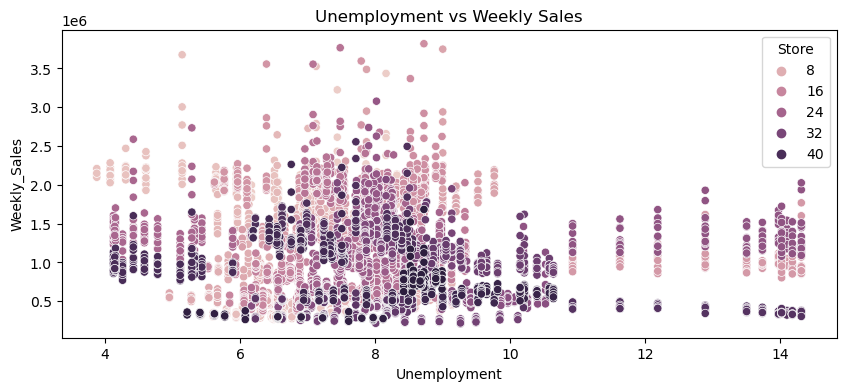

In [53]:
plt.figure(figsize=(10,4))
sns.scatterplot(data=df,x='Unemployment',y='Weekly_Sales',hue='Store')
plt.title("Unemployment vs Weekly Sales")
plt.xlabel('Unemployment')
plt.ylabel('Weekly_Sales')
plt.show()

Weekly sales are effected by unemployment, and mostly the stores 32 and 40

In [11]:
corr = df[['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']].corr()['Weekly_Sales'].sort_values(ascending = False)
corr = corr.to_frame()
corr.style.background_gradient(cmap="copper")

,Weekly_Sales
Weekly_Sales,1.000000
Fuel_Price,0.009464
Temperature,-0.063810
CPI,-0.072634
Unemployment,-0.106176


Correlation- A measure of the extent of interdependence between variables.

Pearson Correlation- The Pearson Correlation measures the linear dependence between two variables X and Y.

The resulting coefficient is a value between -1 and 1, where:

1- Positive linear correlation.

0- No linear correlation.

-1- Negative linear correlation.
Conclusion:

1- Positive correlations are displayed in light color

2- negative correlations are displayed in dark color


In [12]:
columns = ['Store', 'Weekly_Sales', 'Holiday_Flag', 
                     'CPI', 'Temperature', 'Fuel_Price', 
                      'Unemployment']

# Create a subset DataFrame with the selected columns
data = df[columns]

# Calculate correlations
corr = data.corr()

corr

,Store,Weekly_Sales,Holiday_Flag,CPI,Temperature,Fuel_Price,Unemployment
Store,1.000000e+00,-0.335332,-4.386841e-16,-0.209492,-0.022659,0.060023,0.223531
Weekly_Sales,-3.353320e-01,1.000000,3.689097e-02,-0.072634,-0.063810,0.009464,-0.106176
Holiday_Flag,-4.386841e-16,0.036891,1.000000e+00,-0.002162,-0.155091,-0.078347,0.010960
CPI,-2.094919e-01,-0.072634,-2.162091e-03,1.000000,0.176888,-0.170642,-0.302020
Temperature,-2.265908e-02,-0.063810,-1.550913e-01,0.176888,1.000000,0.144982,0.101158
Fuel_Price,6.002295e-02,0.009464,-7.834652e-02,-0.170642,0.144982,1.000000,-0.034684
Unemployment,2.235313e-01,-0.106176,1.096028e-02,-0.302020,0.101158,-0.034684,1.000000


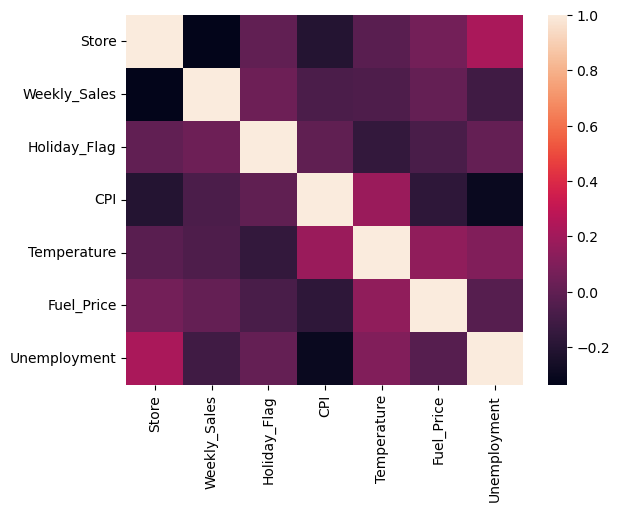

In [22]:
fig = sns.heatmap(data=corr)

This heatmap provides a visual representation of the correlation matrix, where colors indicate the strength and direction of the correlation. You can observe patterns and relationships between different variable.

**Top performing stores according to the historical data**

In [19]:
store_sales = df.groupby('Store')['Weekly_Sales'].sum().reset_index()
store_sales['Rank'] = store_sales['Weekly_Sales'].rank(ascending=False)
top_performing_stores = store_sales.sort_values(by='Rank')
print(top_performing_stores)

    Store  Weekly_Sales  Rank
19     20  3.013978e+08   1.0
3       4  2.995440e+08   2.0
13     14  2.889999e+08   3.0
12     13  2.865177e+08   4.0
1       2  2.753824e+08   5.0
9      10  2.716177e+08   6.0
26     27  2.538559e+08   7.0
5       6  2.237561e+08   8.0
0       1  2.224028e+08   9.0
38     39  2.074455e+08  10.0
18     19  2.066349e+08  11.0
30     31  1.996139e+08  12.0
22     23  1.987506e+08  13.0
23     24  1.940160e+08  14.0
10     11  1.939628e+08  15.0
27     28  1.892637e+08  16.0
40     41  1.813419e+08  17.0
31     32  1.668192e+08  18.0
17     18  1.551147e+08  19.0
21     22  1.470756e+08  20.0
11     12  1.442872e+08  21.0
25     26  1.434164e+08  22.0
33     34  1.382498e+08  23.0
39     40  1.378703e+08  24.0
34     35  1.315207e+08  25.0
7       8  1.299512e+08  26.0
16     17  1.277821e+08  27.0
44     45  1.123953e+08  28.0
20     21  1.081179e+08  29.0
24     25  1.010612e+08  30.0
42     43  9.056544e+07  31.0
14     15  8.913368e+07  32.0
6       7 

In [20]:
sales = df.groupby(by='Store')["Weekly_Sales"].sum().sort_values(ascending=False).reset_index()

[Text(0.5, 0, 'Store'), Text(0, 0.5, 'Total Sales')]

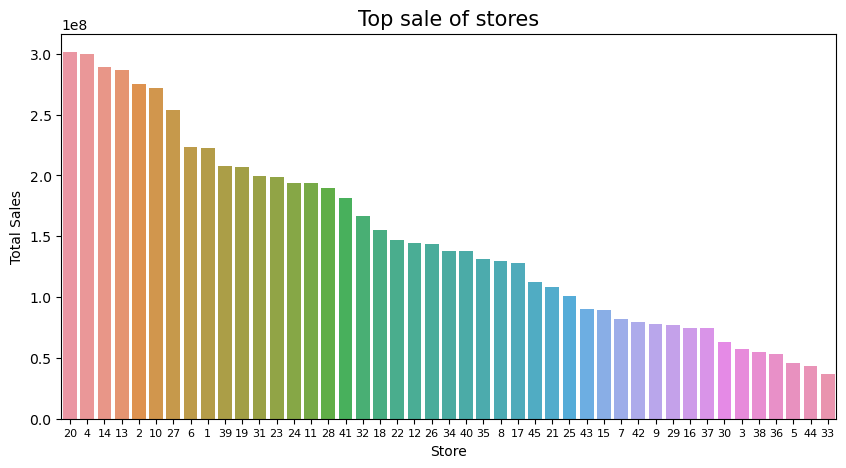

In [21]:
plt.figure(figsize=(10,5))
plt.xticks(fontsize=8)
plt.yticks(fontsize=10)
plt.xlabel("Total sales",fontsize=10)
plt.ylabel("Store",fontsize=10)
plt.title("Top sale of stores",fontsize=15)
ax = sns.barplot(x=sales.Store.astype(str), y=sales.Weekly_Sales)
ax.set(xlabel="Store",ylabel="Total Sales")

There is a high variance in weekly sales from one store to another store. Store No. 20 has the highest sales from any store followed by Store No. 4 and Store No. 33 comes last.

              ***** Now we will check best performing store and worst performing store******

In [22]:
store_sales = df.groupby('Store')['Weekly_Sales'].sum().reset_index()
worst_store = store_sales.loc[store_sales['Weekly_Sales'].idxmin()]

best_store = store_sales.loc[store_sales['Weekly_Sales'].idxmax()]

sales_difference = best_store['Weekly_Sales'] - worst_store['Weekly_Sales']

sales_std_dev = store_sales['Weekly_Sales'].std()
significance = sales_difference / sales_std_dev

print("Worst Performing Store:")
print(worst_store)

print("\nBest Performing Store:")
print(best_store)

print("\nDifference in Sales (Best - Worst):", sales_difference)
print("Significance of Difference (in Std Devs):", significance)

Worst Performing Store:
Store                 33.00
Weekly_Sales    37160221.96
Name: 32, dtype: float64

Best Performing Store:
Store           2.000000e+01
Weekly_Sales    3.013978e+08
Name: 19, dtype: float64

Difference in Sales (Best - Worst): 264237570.49999997
Significance of Difference (in Std Devs): 3.3803995206807564


In [ ]:
     ****Now we will check weekly sales show a seasonal trend, when and what could be the reason?****

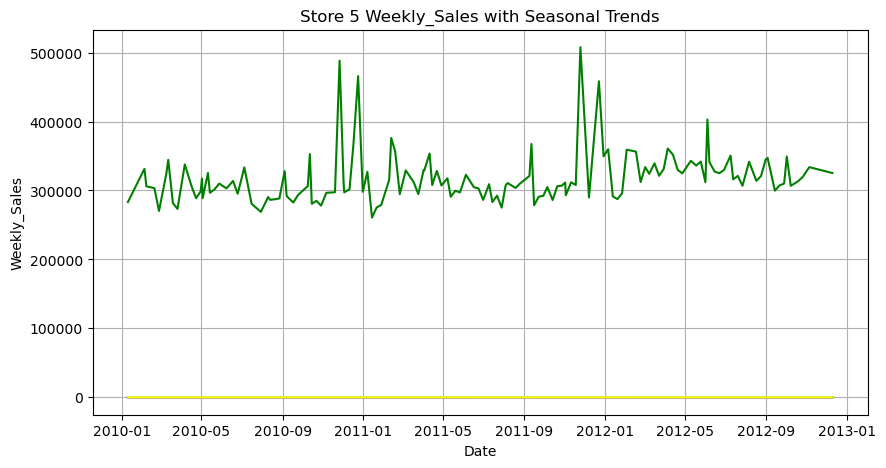

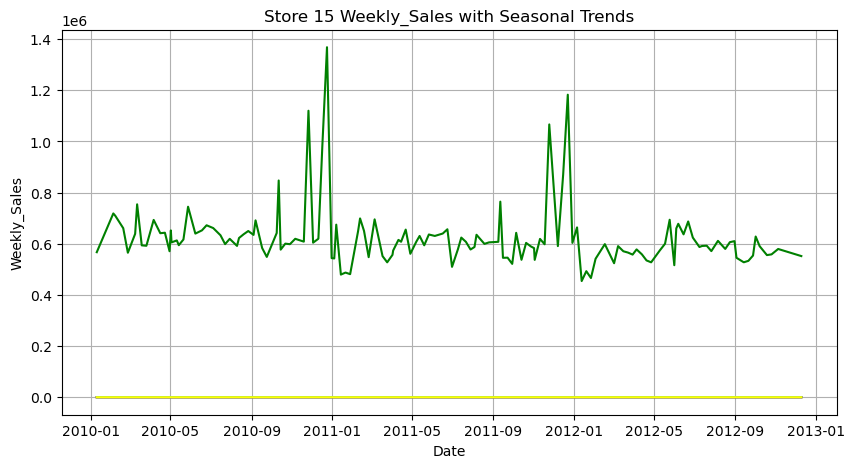

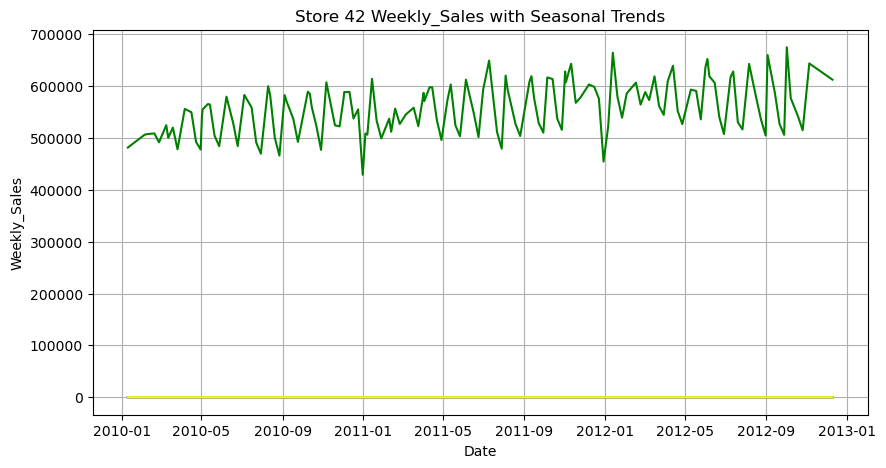

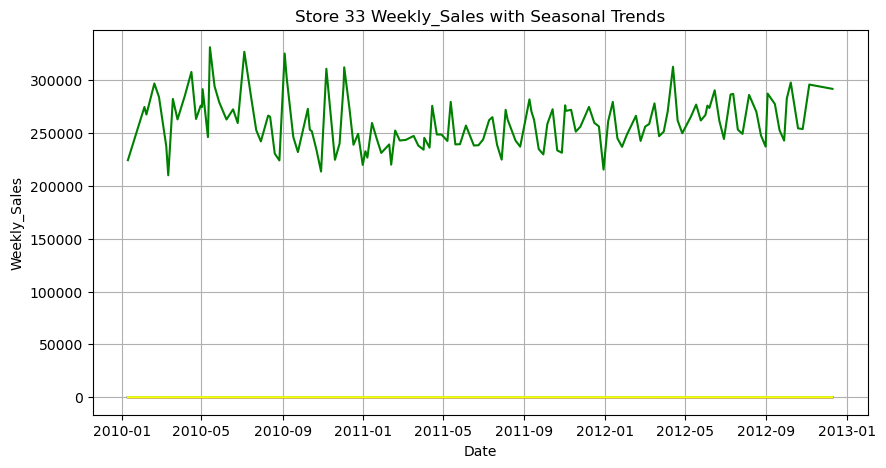

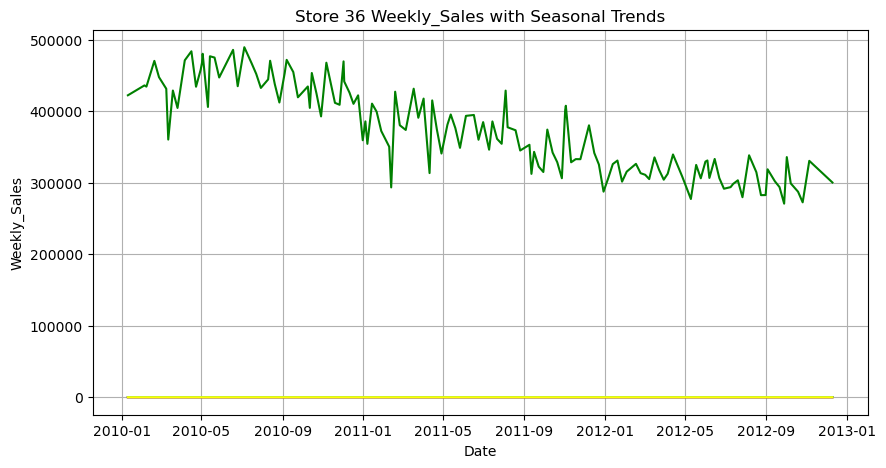

...

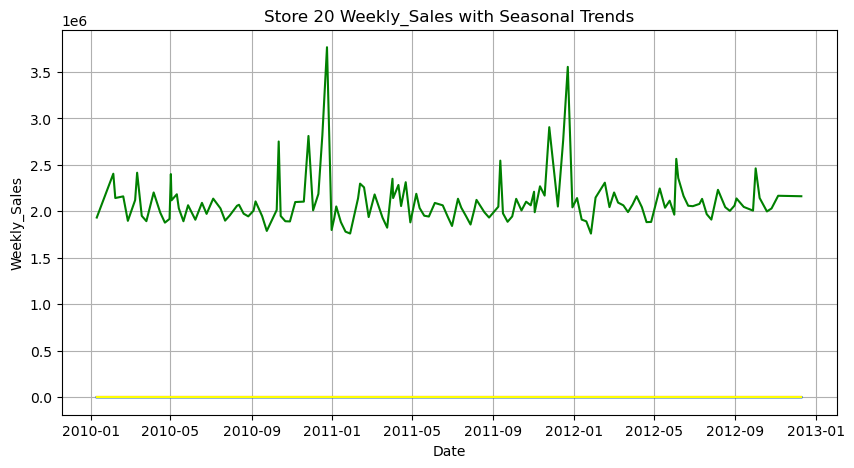

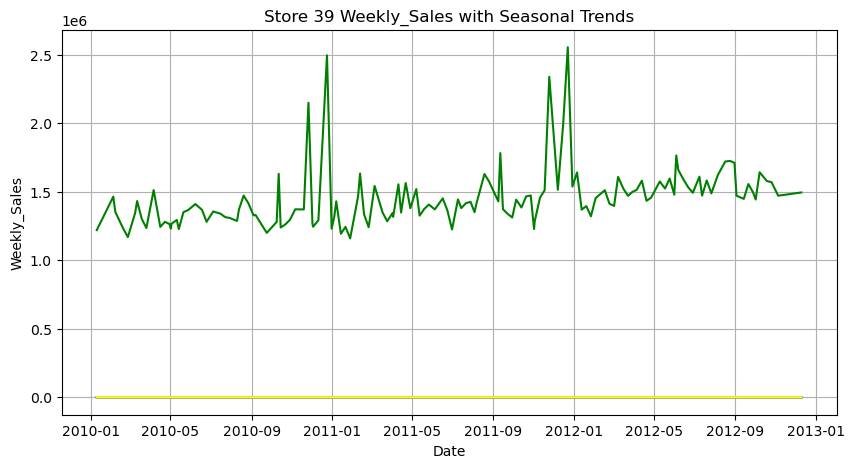

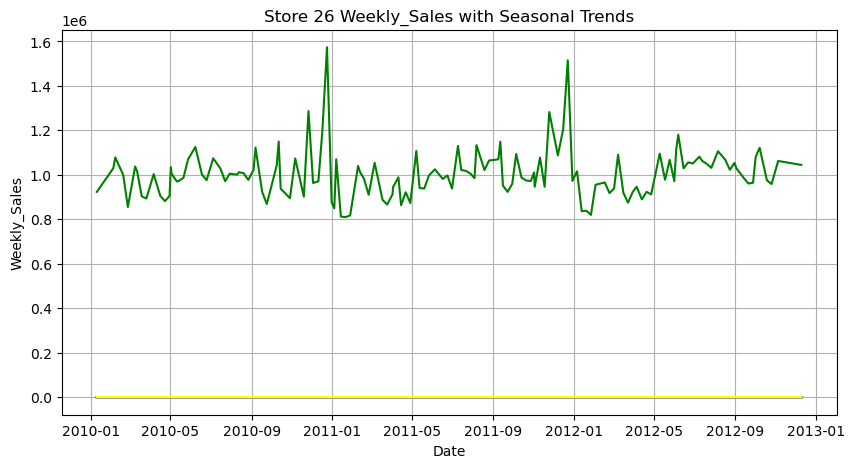

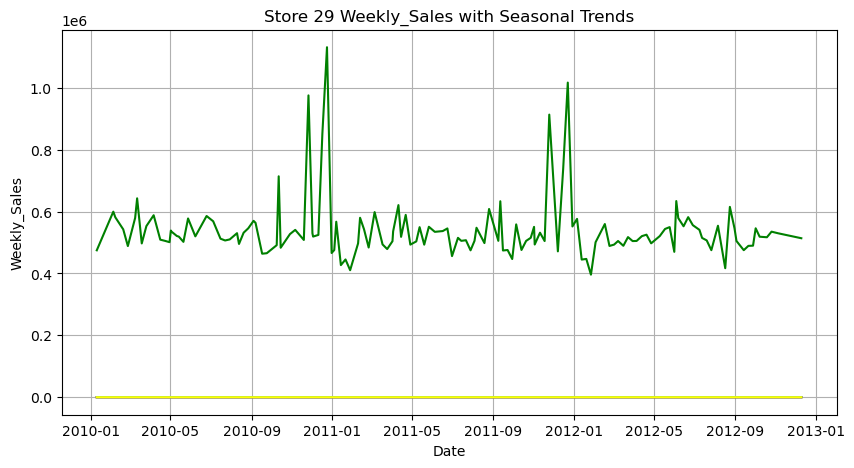

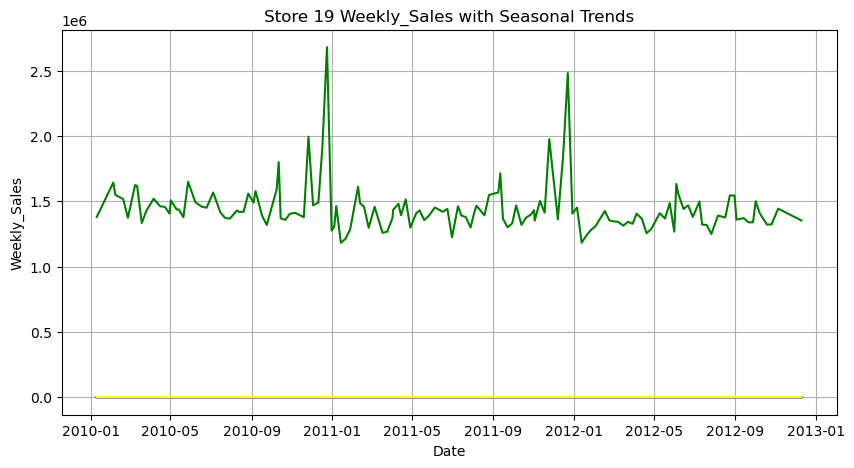

In [23]:
df = df.sort_values(by='Date')

for store in df['Store'].unique():
    store_data = df[df['Store'] == store]

    # Setting 'Date' as the index
    store_data.set_index('Date', inplace=True)

    # Plot the weekly sales data for each store to identify seasonal trends
    plt.figure(figsize=(10, 5))
    plt.plot(store_data['Weekly_Sales'], label=f'Store {store} Weekly_Sales', color='green')
    plt.plot(store_data['Holiday_Flag'], color='red')
    plt.plot(store_data['Temperature'], color='blue')
    plt.plot(store_data['Fuel_Price'], color='Orange')
    plt.plot(store_data['CPI'], color='c')
    plt.plot(store_data['Unemployment'], color='yellow')

    plt.title(f'Store {store} Weekly_Sales with Seasonal Trends')
    plt.xlabel('Date')
    plt.ylabel('Weekly_Sales')
    plt.grid(True)

**Weekly seasonal sales are high duing holiday season**

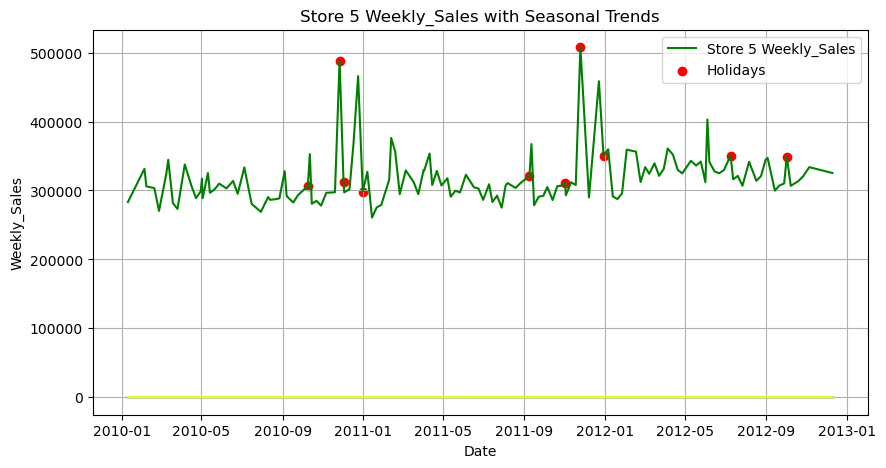

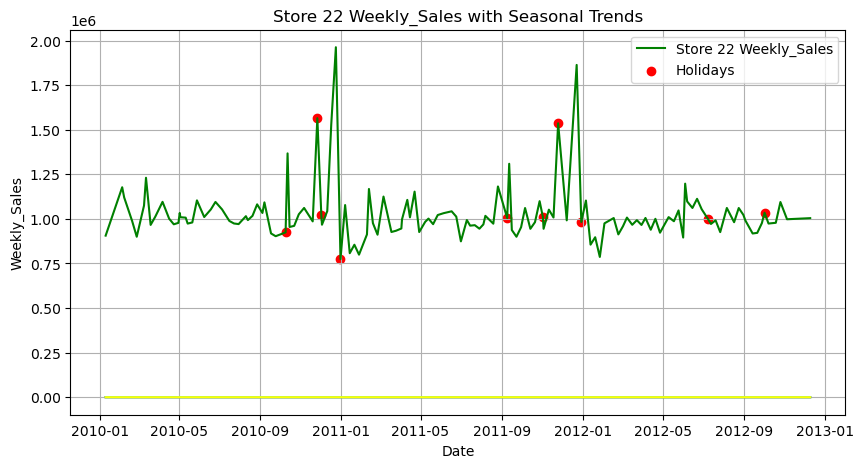

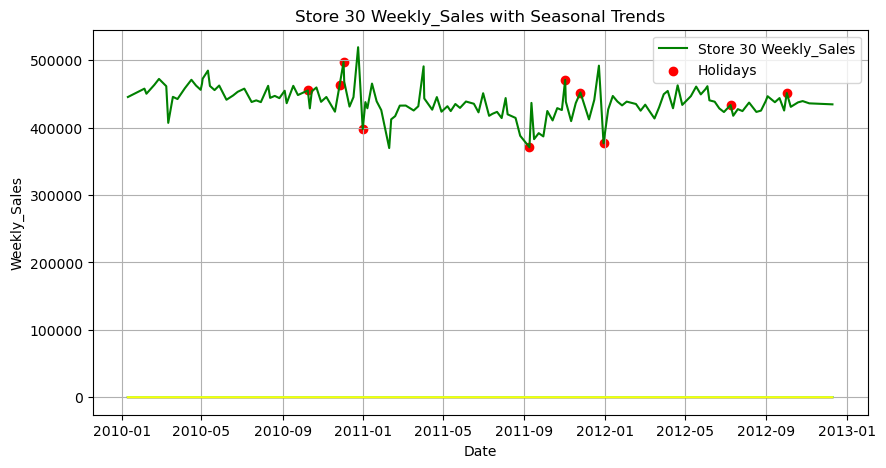

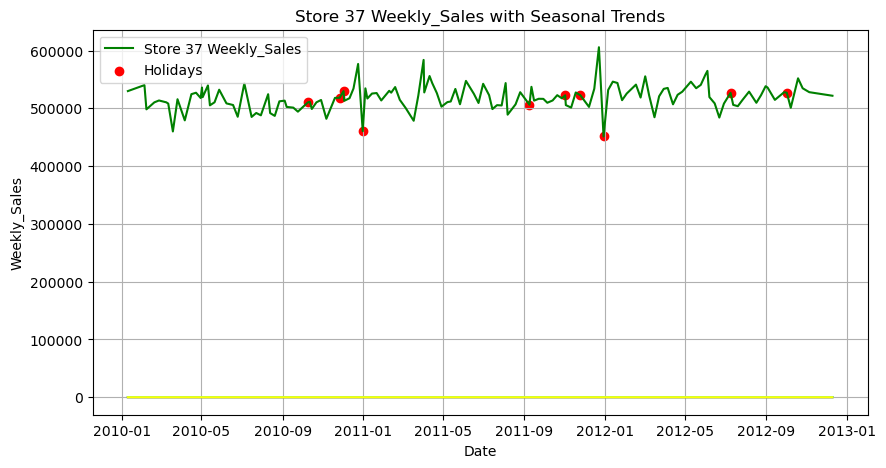

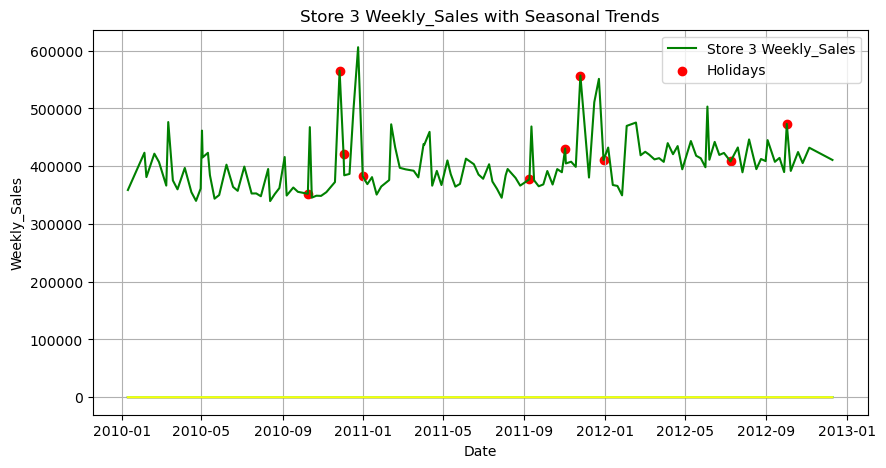

...

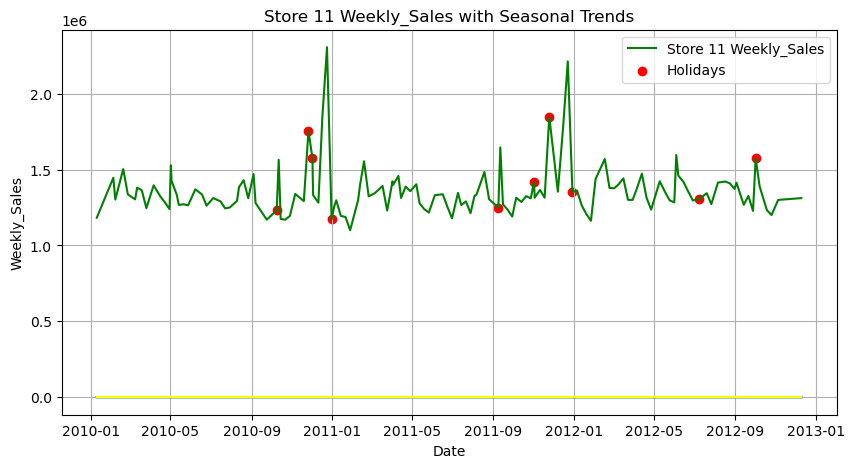

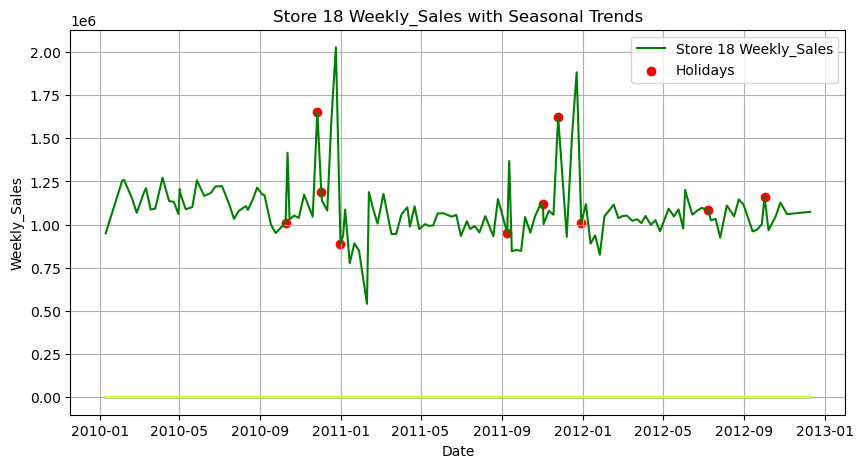

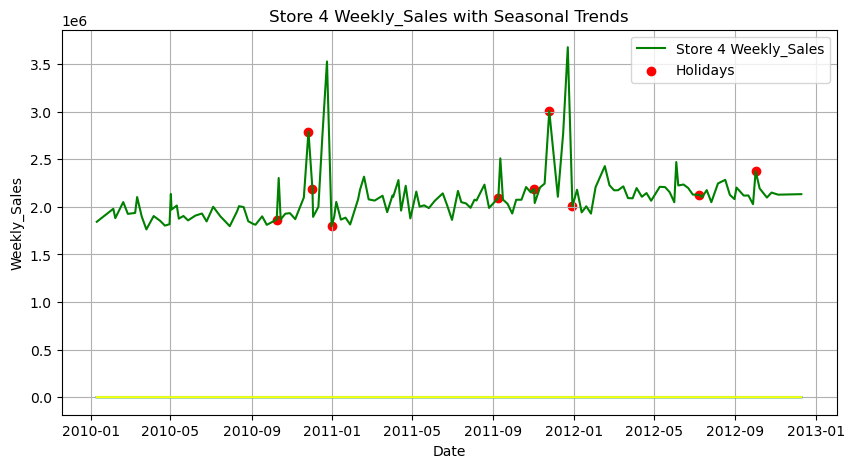

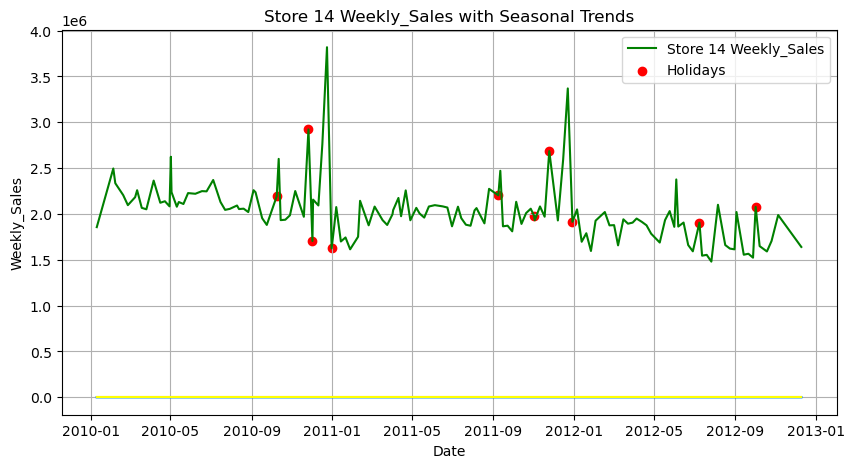

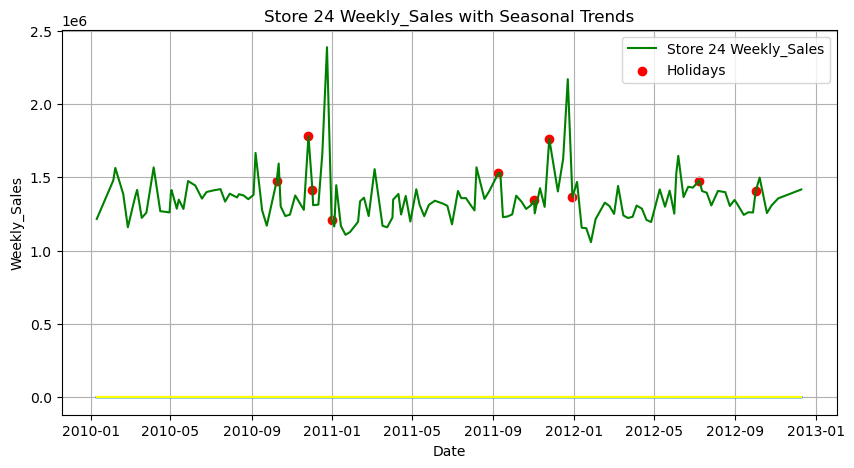

In [24]:
df = df.sort_values(by='Date')

for store in df['Store'].unique():
    store_data = df[df['Store'] == store]

    # Setting 'Date' as the index
    store_data.set_index('Date', inplace=True)

    # Plot the weekly sales data for each store to identify seasonal trends
    plt.figure(figsize=(10, 5))
    plt.plot(store_data['Weekly_Sales'], label=f'Store {store} Weekly_Sales', color='green')
    holiday_dates = store_data[store_data['Holiday_Flag'] == 1].index
    plt.scatter(holiday_dates, store_data.loc[holiday_dates, 'Weekly_Sales'], color='red', label='Holidays')

    plt.plot(store_data['Temperature'], color='blue')
    plt.plot(store_data['Fuel_Price'], color='orange')
    plt.plot(store_data['CPI'], color='cyan')
    plt.plot(store_data['Unemployment'], color='yellow')

    plt.title(f'Store {store} Weekly_Sales with Seasonal Trends')
    plt.xlabel('Date')
    plt.ylabel('Weekly_Sales')
    plt.legend()
    plt.grid(True)
    plt.show()

**Does temperature affect the weekly sales in any manner**

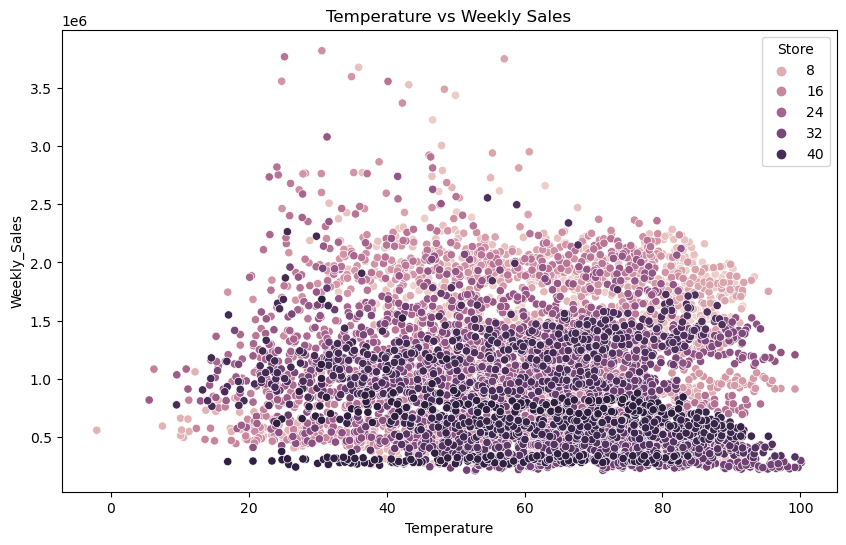

In [98]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df,x='Temperature',y='Weekly_Sales',hue='Store')
plt.title("Temperature vs Weekly Sales")
plt.xlabel('Temperature')
plt.ylabel('Weekly_Sales')
plt.show()

**Weekly sales are low during summer and winter season**

# **Forecast the sales for each store for the next 12 weeks**

In [101]:
# Setting Date column as Index
df.set_index('Date',inplace = True)

In [102]:
# Testing for stationarity

from statsmodels.tsa.stattools import adfuller
#ADF Test

#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(Weekly_Sales):
    result=adfuller(Weekly_Sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [103]:
adfuller_test(df['Weekly_Sales'])

ADF Test Statistic : -4.624149498578306
p-value : 0.00011655869699901148
#Lags Used : 34
Number of Observations Used : 6400
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


Time series is stationary.


<Axes: xlabel='Date'>

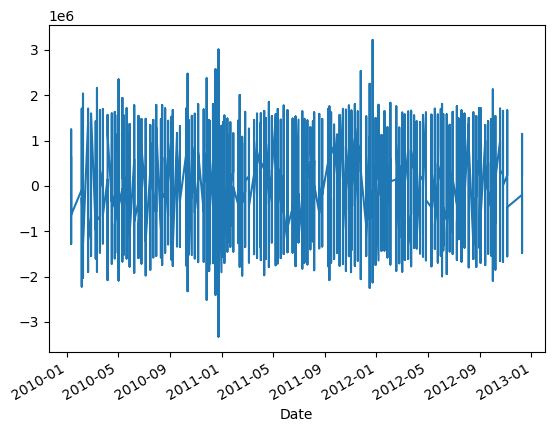

In [29]:
df['Weekly_Sales_Diff'] = df['Weekly_Sales'] - df['Weekly_Sales'].shift(1)
result = adfuller(df['Weekly_Sales_Diff'].dropna())
if result[1] <= 0.05:
    print("Time series is stationary.")
else:
    print("Time series is not stationary. You may need to difference again or apply other transformations.")
df['Weekly_Sales_Diff'].plot()

In [104]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [105]:
df = df.iloc[:, :2]
df.head()

,Store,Weekly_Sales
Date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68


In [106]:
sales_data =  df[df['Store'] == 1]
sales_data.drop(columns='Store', inplace = True)

In [107]:
sales_data.head()

,Weekly_Sales
Date,
2010-02-05,1643690.90
2010-02-12,1641957.44
2010-02-19,1611968.17
2010-02-26,1409727.59
2010-03-05,1554806.68


Time series is stationary.


<Axes: xlabel='Date'>

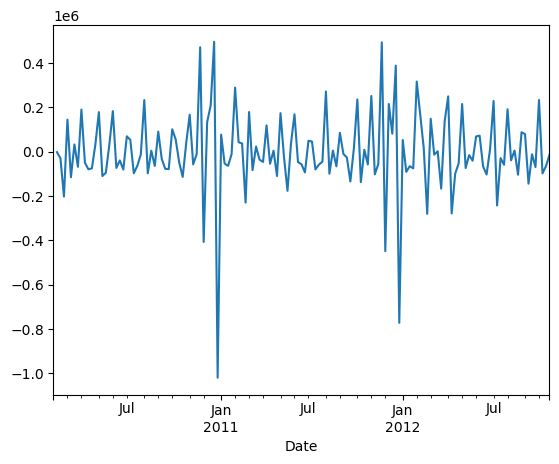

In [108]:
sales_data['Weekly_Sales_Diff'] = sales_data['Weekly_Sales'] - sales_data['Weekly_Sales'].shift(1)
result = adfuller(sales_data['Weekly_Sales_Diff'].dropna())
if result[1] <= 0.05:
    print("Time series is stationary.")
else:
    print("Time series is not stationary. You may need to difference again or apply other transformations.")
sales_data['Weekly_Sales_Diff'].plot()

In [109]:
sales_data.isna().sum()

Weekly_Sales         0
Weekly_Sales_Diff    1
dtype: int64

In [110]:
sales_data.dropna(inplace=True)

In [111]:
sales_data.head()

,Weekly_Sales,Weekly_Sales_Diff
Date,,
2010-02-12,1641957.44,-1733.46
2010-02-19,1611968.17,-29989.27
2010-02-26,1409727.59,-202240.58
2010-03-05,1554806.68,145079.09
2010-03-12,1439541.59,-115265.09


In [112]:
sales_data.drop(columns = 'Weekly_Sales',inplace = True)

In [113]:
sales_data.head()

,Weekly_Sales_Diff
Date,
2010-02-12,-1733.46
2010-02-19,-29989.27
2010-02-26,-202240.58
2010-03-05,145079.09
2010-03-12,-115265.09


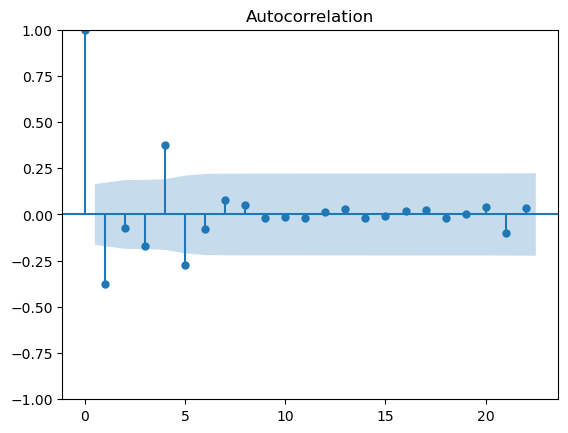

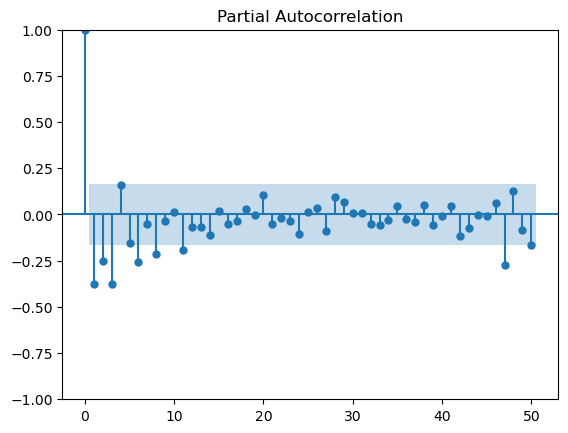

In [114]:
plot_acf(sales_data);
plot_pacf(sales_data,lags=50);

In [115]:
sales_data.reset_index(inplace = True)

In [116]:
!pip install pmdarima

In [117]:
from pmdarima import auto_arima
order = auto_arima(sales_data['Weekly_Sales_Diff'])
order.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  142
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -1894.504
Date:                Sat, 06 Apr 2024   AIC                           3795.008
Time:                        17:19:53   BIC                           3803.875
Sample:                             0   HQIC                          3798.611
                                - 142                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2745      0.065      4.213      0.000       0.147       0.402
ma.L1         -0.9674      0.035    -27.830      0.000      -1.035      -0.899
sigma2      2.445e+10   6.44e-13   3.79e+22      0.000    2.44e+10    2.44e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               317.31
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               0.80   Skew:                             1.78
Prob(H) (two-sided):                  0.46   Kurtosis:                         9.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.19e+38. Standard errors may be unstable.
"""

In [68]:
train  = sales_data.iloc[:120]
test  = sales_data.iloc[120:]

In [118]:
train

,Date,Weekly_Sales,Weekly_Sales_Diff
0,12-02-2010,1641957.44,-1733.46
1,19-02-2010,1611968.17,-29989.27
2,26-02-2010,1409727.59,-202240.58
3,05-03-2010,1554806.68,145079.09
4,12-03-2010,1439541.59,-115265.09
...,...,...,...
115,27-04-2012,1468928.37,-52649.50
116,04-05-2012,1684519.99,215591.62
117,11-05-2012,1611096.05,-73423.94
118,18-05-2012,1595901.87,-15194.18


In [69]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model=sm.tsa.statespace.SARIMAX(sales_data['Weekly_Sales_Diff'],order=(0,0,2))
results =model.fit()

In [119]:
sales_data.head()

,Date,Weekly_Sales_Diff
0,2010-02-12,-1733.46
1,2010-02-19,-29989.27
2,2010-02-26,-202240.58
3,2010-03-05,145079.09
4,2010-03-12,-115265.09


In [120]:
sales_data['forecast'] = results.predict(start=len(train), end=len(train)+len(test)-1).reset_index(drop=True)
sales_data

,Date,Weekly_Sales_Diff,forecast
0,2010-02-12,-1733.46,39744.812256
1,2010-02-19,-29989.27,-9820.819256
2,2010-02-26,-202240.58,-66209.403332
3,2010-03-05,145079.09,-17739.603944
4,2010-03-12,-115265.09,61674.135188
...,...,...,...
137,2012-09-28,-69066.80,NaN
138,2012-10-05,233726.71,NaN
139,2012-10-12,-97713.16,NaN
140,2012-10-19,-65004.04,NaN


In [121]:
sales_data.isna().sum()

Date                   0
Weekly_Sales_Diff      0
forecast             120
dtype: int64

In [122]:
sales_data.set_index('Date',inplace = True)

In [123]:
sales_data

,Weekly_Sales_Diff,forecast
Date,,
2010-02-12,-1733.46,39744.812256
2010-02-19,-29989.27,-9820.819256
2010-02-26,-202240.58,-66209.403332
2010-03-05,145079.09,-17739.603944
2010-03-12,-115265.09,61674.135188
...,...,...
2012-09-28,-69066.80,NaN
2012-10-05,233726.71,NaN
2012-10-12,-97713.16,NaN


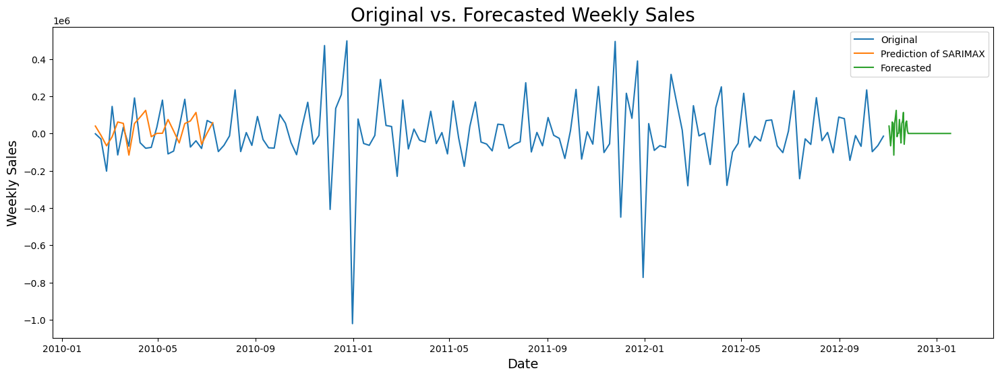

            Weekly_Sales_Diff_Forecast
Date                                  
2012-11-02                39744.812256
2012-11-03                -9820.819256
2012-11-04               -66209.403332
2012-11-05               -17739.603944
2012-11-06                61674.135188
...                                ...
2013-01-14                    0.000000
2013-01-15                    0.000000
2013-01-16                    0.000000
2013-01-17                    0.000000
2013-01-18                    0.000000

[78 rows x 1 columns]


In [124]:
# Create a date range for the next 12 weeks
sales_data.index = pd.to_datetime(sales_data.index)
forecast_start_date = sales_data.index[-1] + pd.DateOffset(weeks=1)  # Start from the next week
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=11)   # Forecast for 12 weeks

forecast_date_range = pd.date_range(forecast_start_date, forecast_end_date)

# Forecast the next 12 weeks
forecast = results.predict(start=len(train), end=len(train) + len(forecast_date_range) - 1)

# Create a DataFrame for the forecasted data with the appropriate date index
forecast_df = pd.DataFrame({'Date': forecast_date_range, 'Weekly_Sales_Diff_Forecast': forecast})
forecast_df.set_index('Date', inplace=True)

# Plot the original and forecasted data
plt.figure(figsize=(18, 6))
plt.title('Original vs. Forecasted Weekly Sales', fontsize=20)
plt.plot(sales_data['Weekly_Sales_Diff'], label='Original')
plt.plot(sales_data.forecast, label='Prediction of SARIMAX')
plt.plot(forecast_df['Weekly_Sales_Diff_Forecast'], label='Forecasted')
plt.legend(loc='best')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Weekly Sales', fontsize=14)
plt.show()

# Print the forecasted data with date index
print(forecast_df)

In [125]:
# sales_data.reset_index(inplace = True)
sales_data

,Weekly_Sales_Diff,forecast
Date,,
2010-02-12,-1733.46,39744.812256
2010-02-19,-29989.27,-9820.819256
2010-02-26,-202240.58,-66209.403332
2010-03-05,145079.09,-17739.603944
2010-03-12,-115265.09,61674.135188
...,...,...
2012-09-28,-69066.80,NaN
2012-10-05,233726.71,NaN
2012-10-12,-97713.16,NaN


Store 1: Time series is stationary.


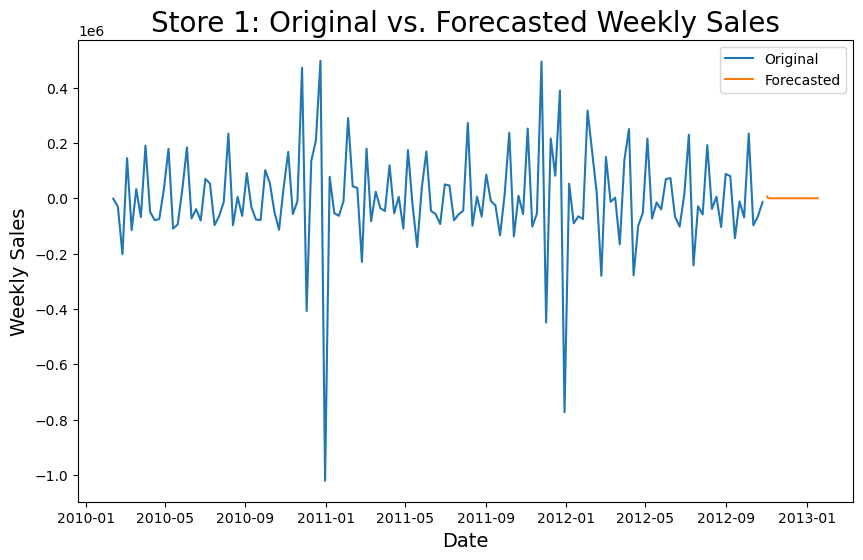

Store 2: Time series is stationary.


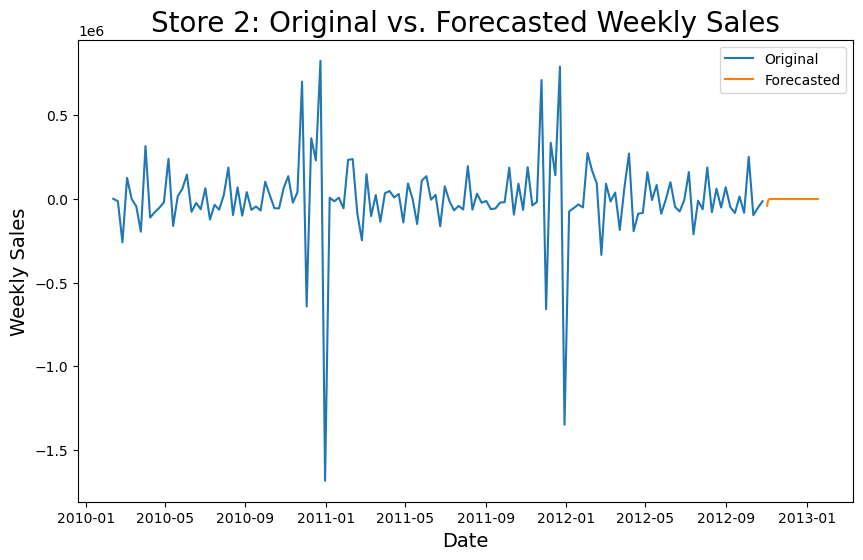

Store 3: Time series is stationary.


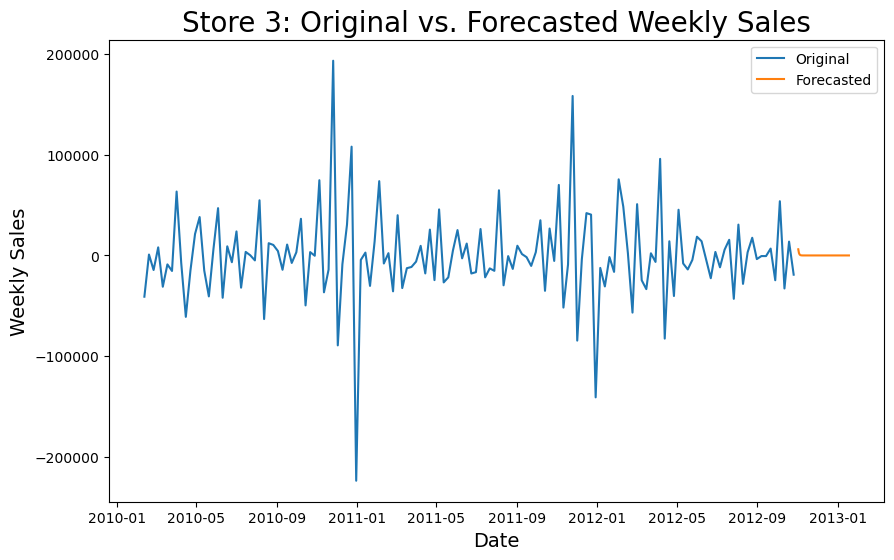

Store 4: Time series is stationary.


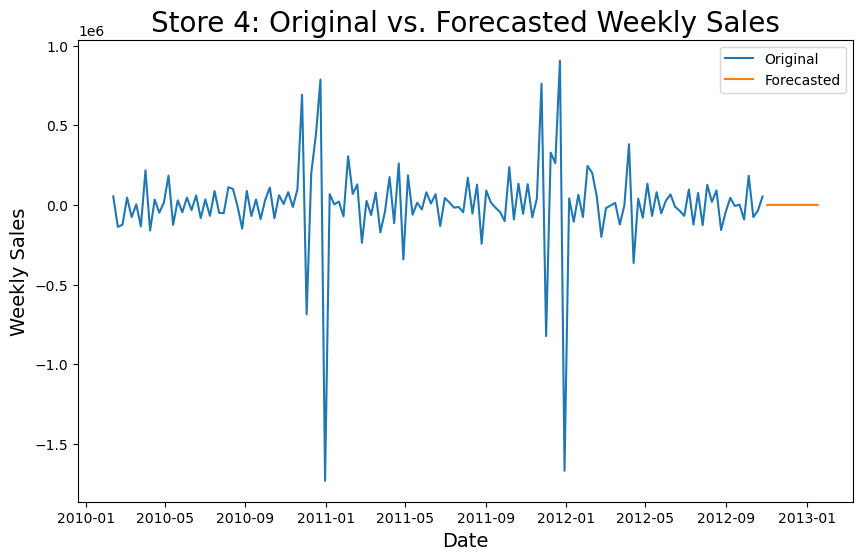

Store 5: Time series is stationary.


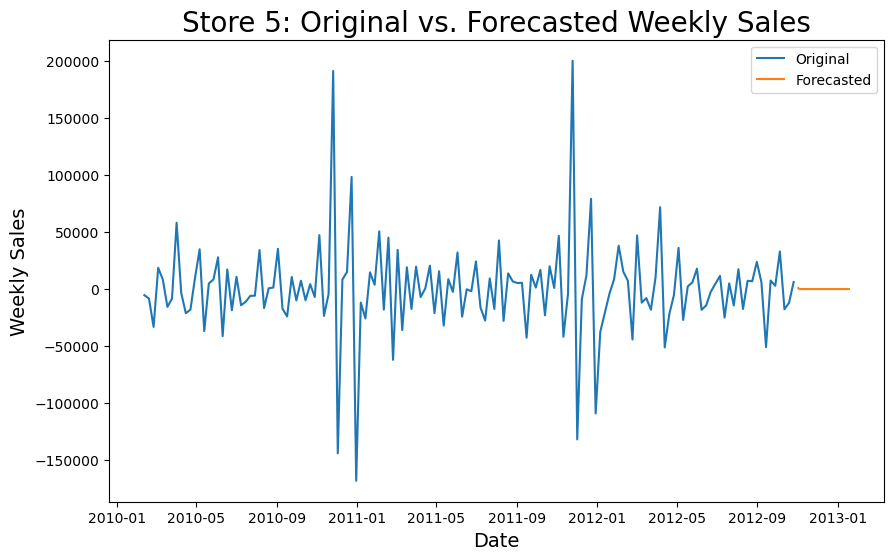

Store 6: Time series is stationary.


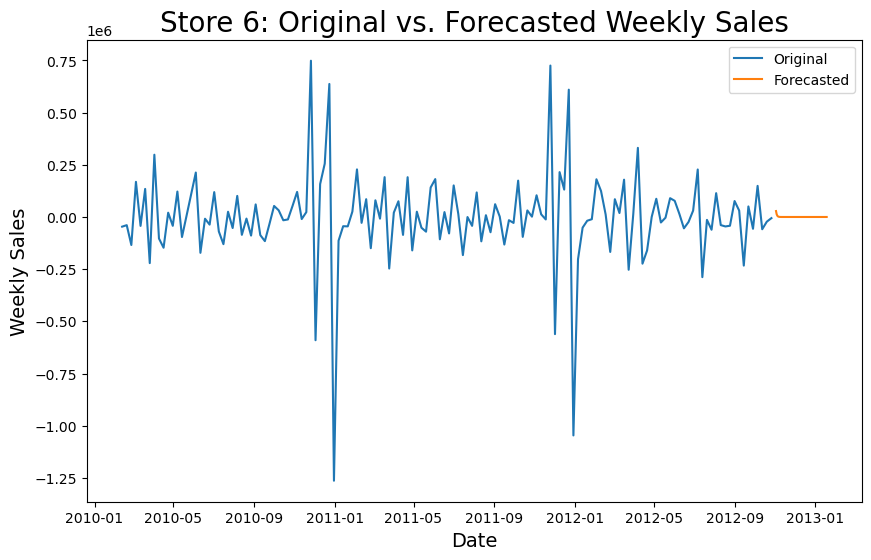

Store 7: Time series is stationary.


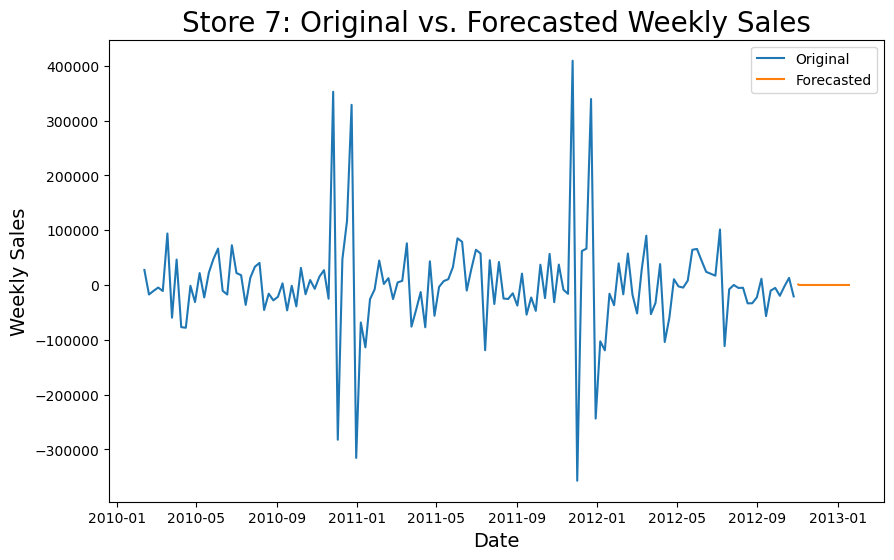

Store 8: Time series is stationary.


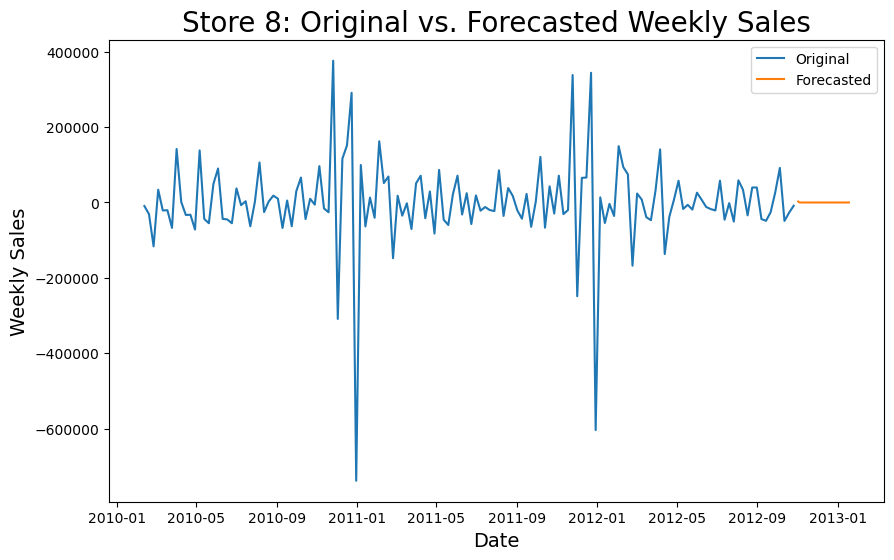

Store 9: Time series is stationary.


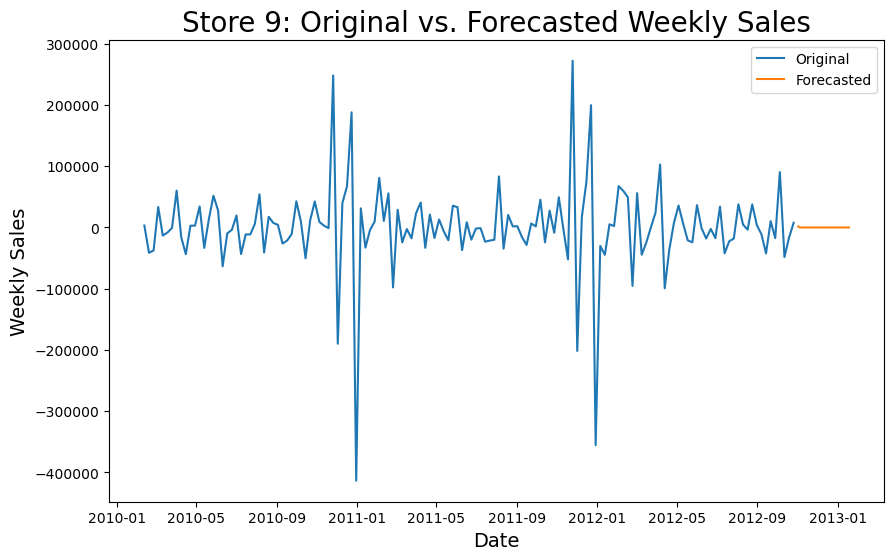

Store 10: Time series is stationary.


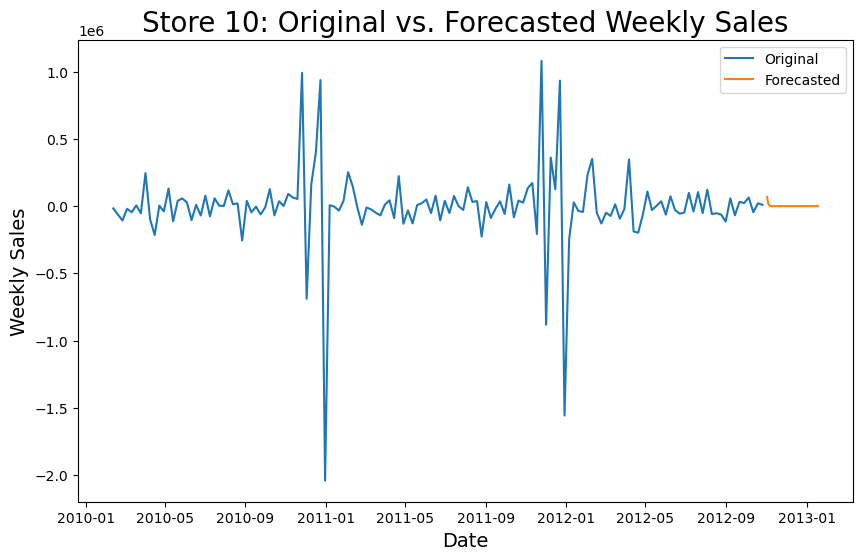

Store 11: Time series is stationary.


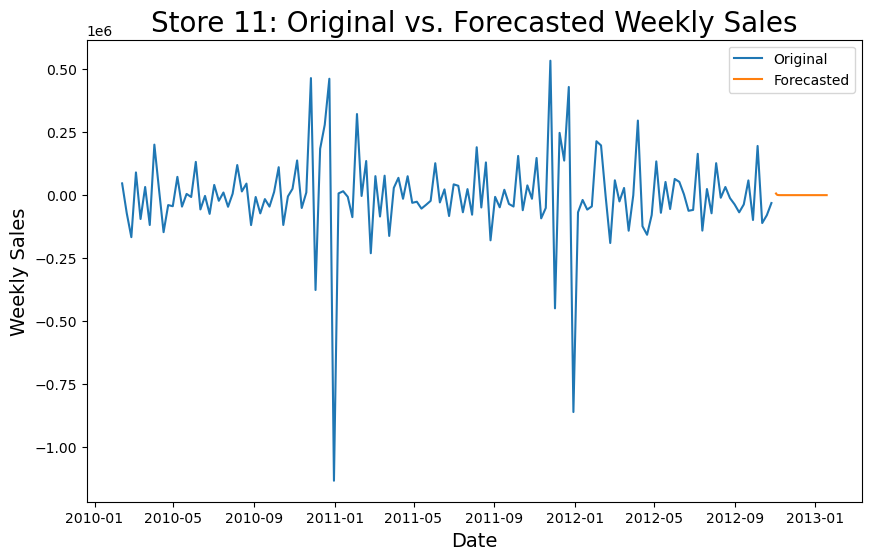

Store 12: Time series is stationary.


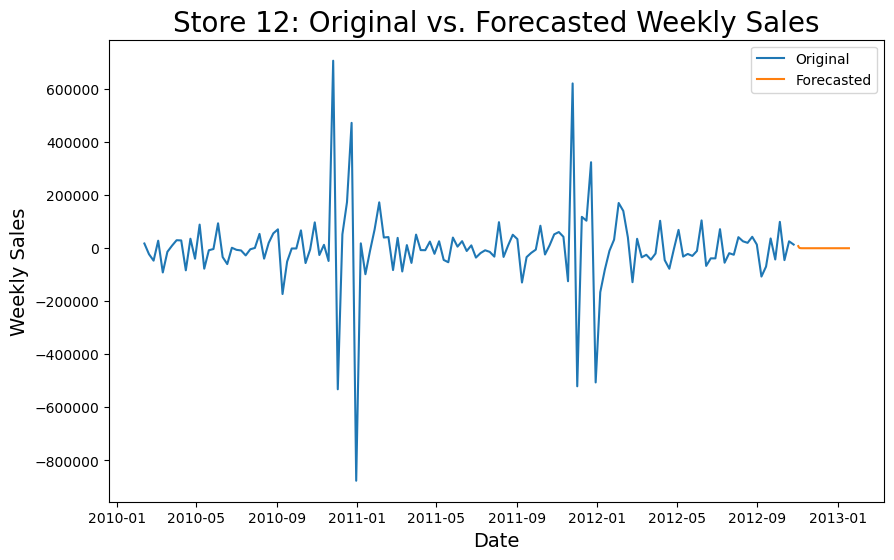

Store 13: Time series is stationary.


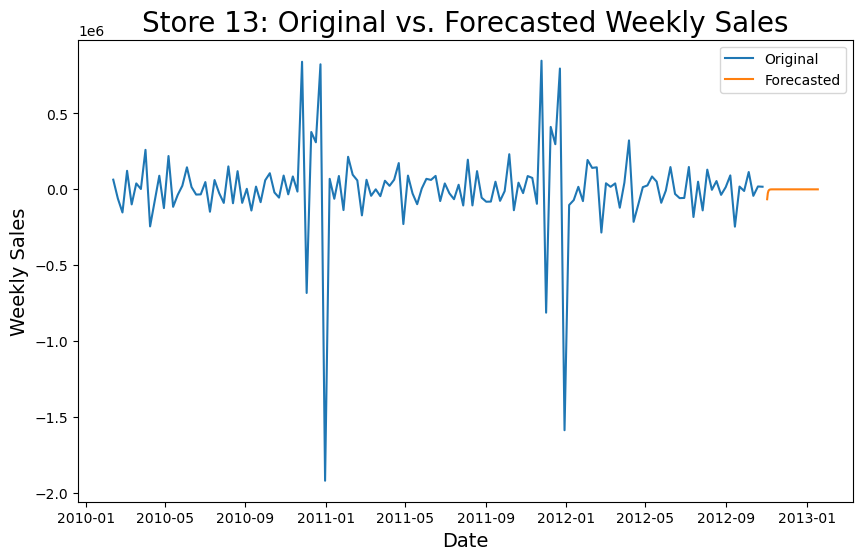

Store 14: Time series is stationary.


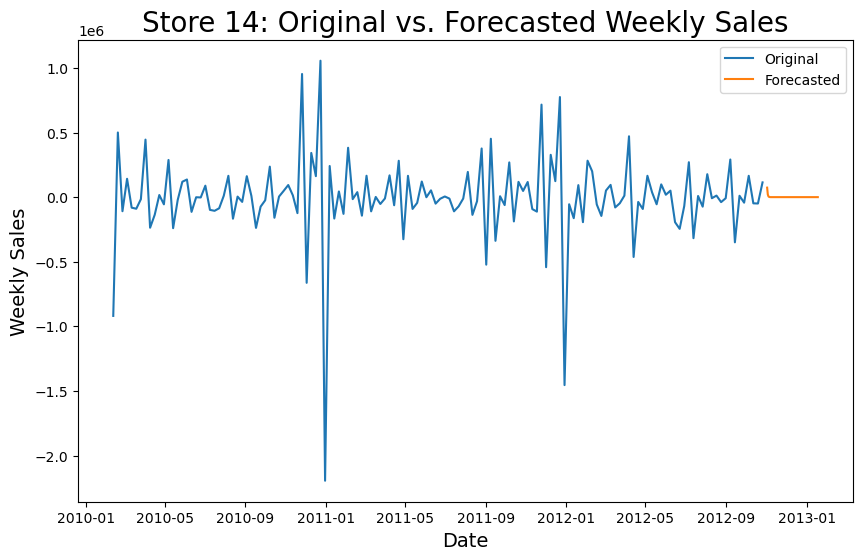

Store 15: Time series is stationary.


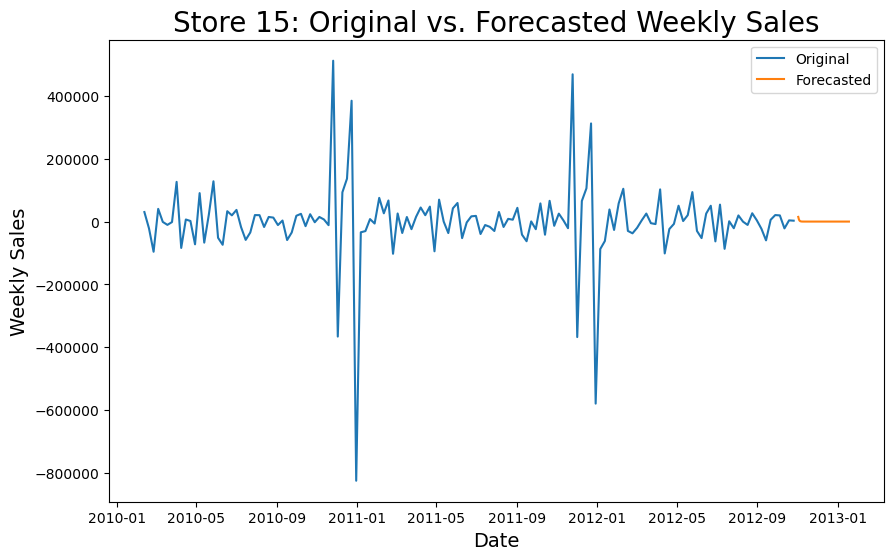

Store 16: Time series is stationary.


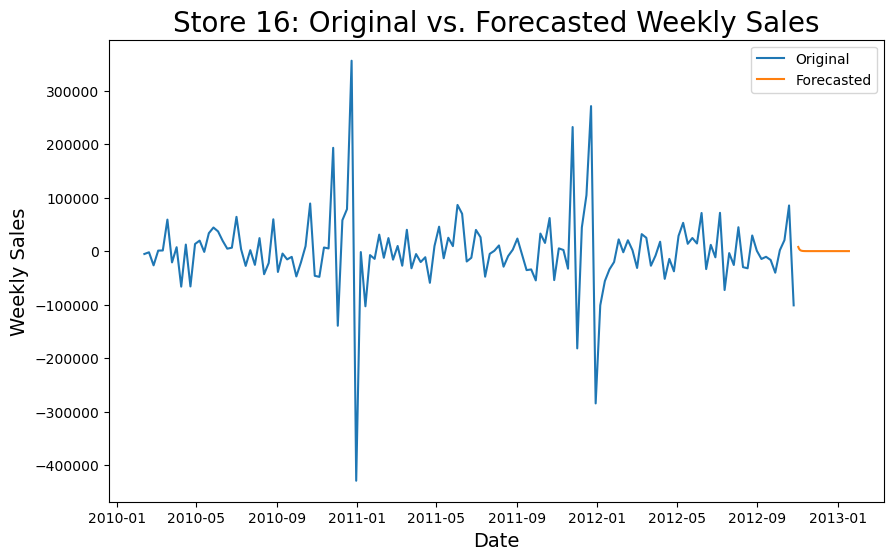

Store 17: Time series is stationary.


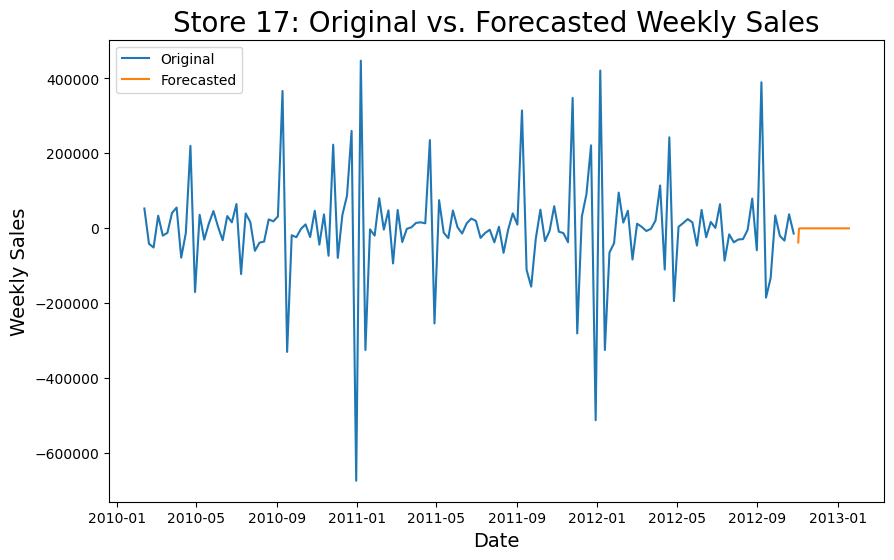

Store 18: Time series is stationary.


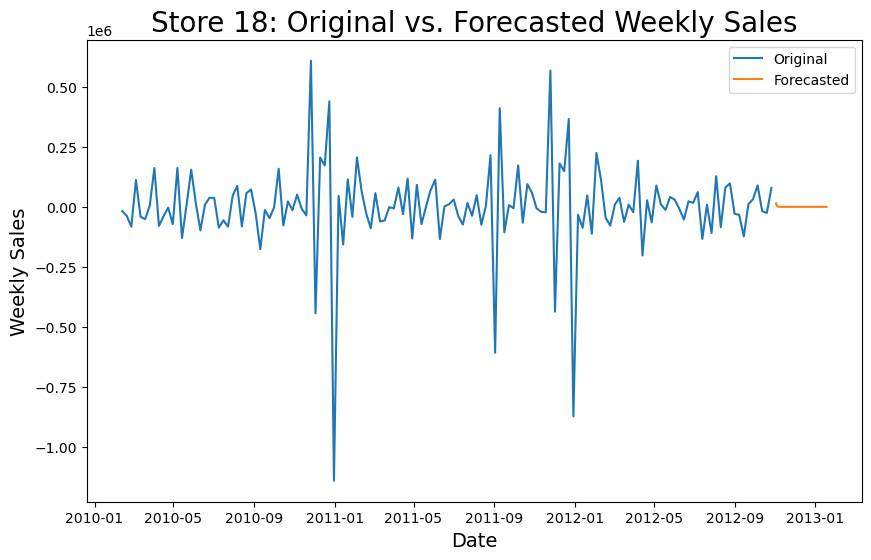

Store 19: Time series is stationary.


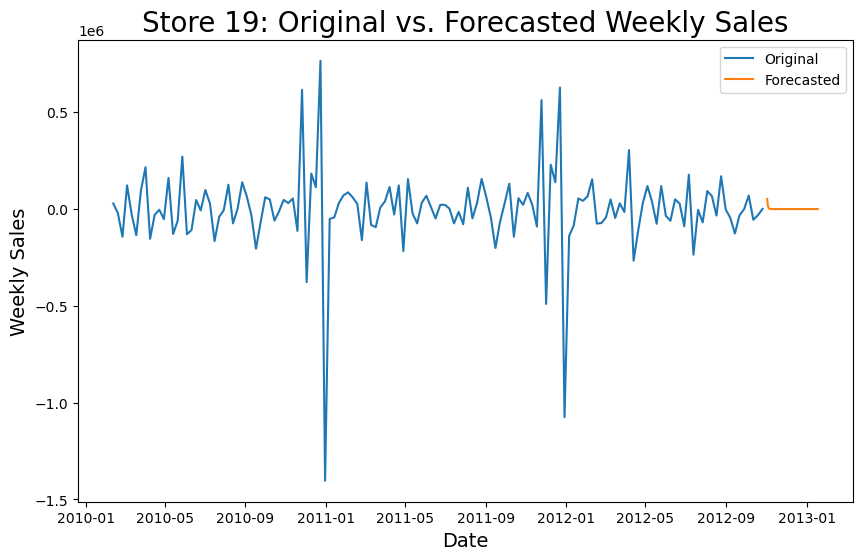

Store 20: Time series is stationary.


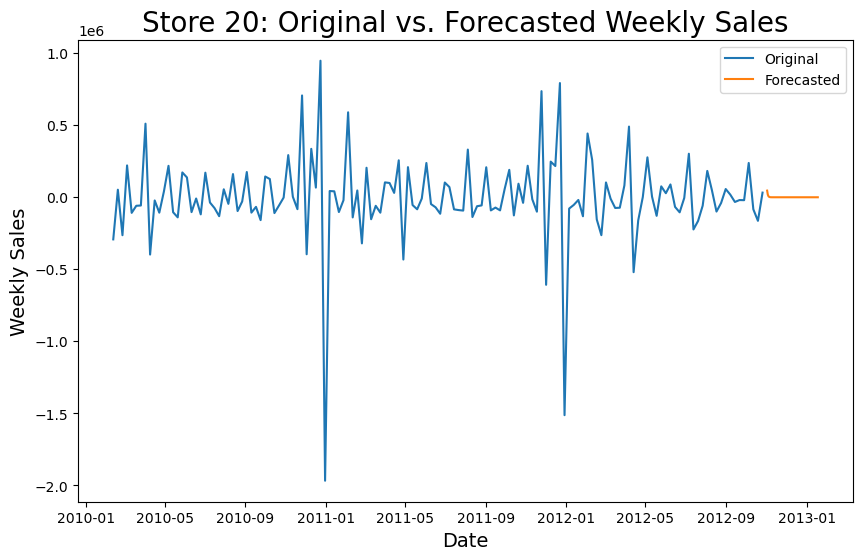

Store 21: Time series is stationary.


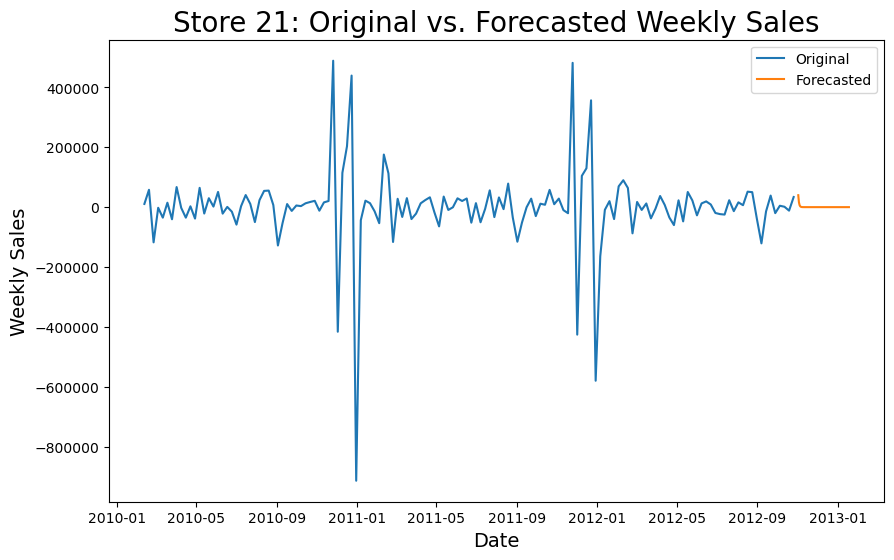

Store 22: Time series is stationary.


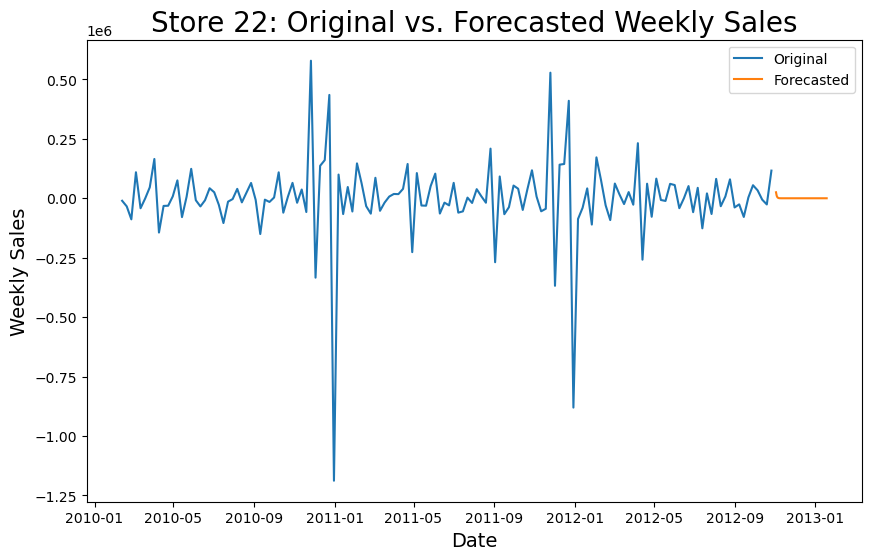

Store 23: Time series is stationary.


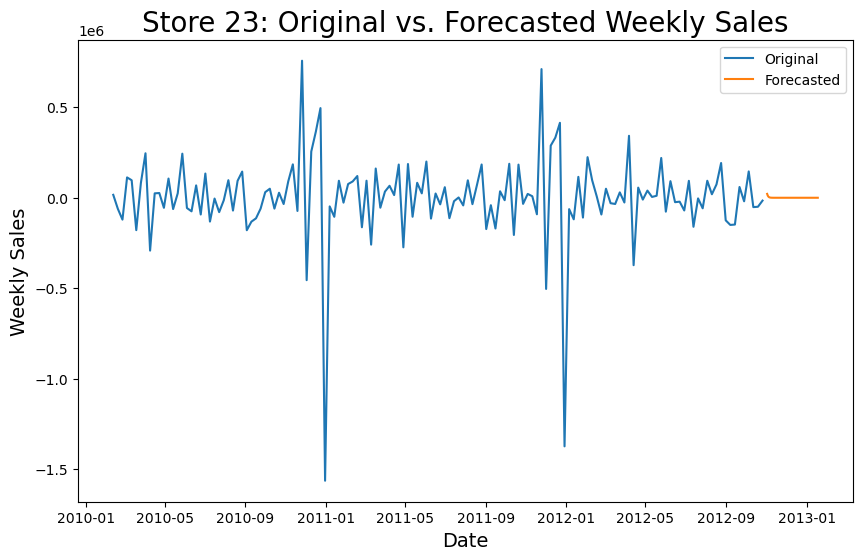

Store 24: Time series is stationary.


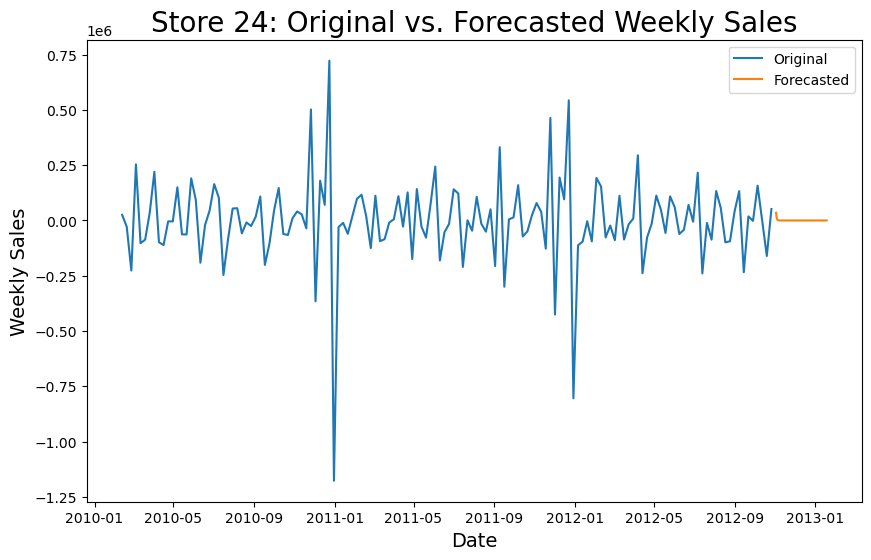

Store 25: Time series is stationary.


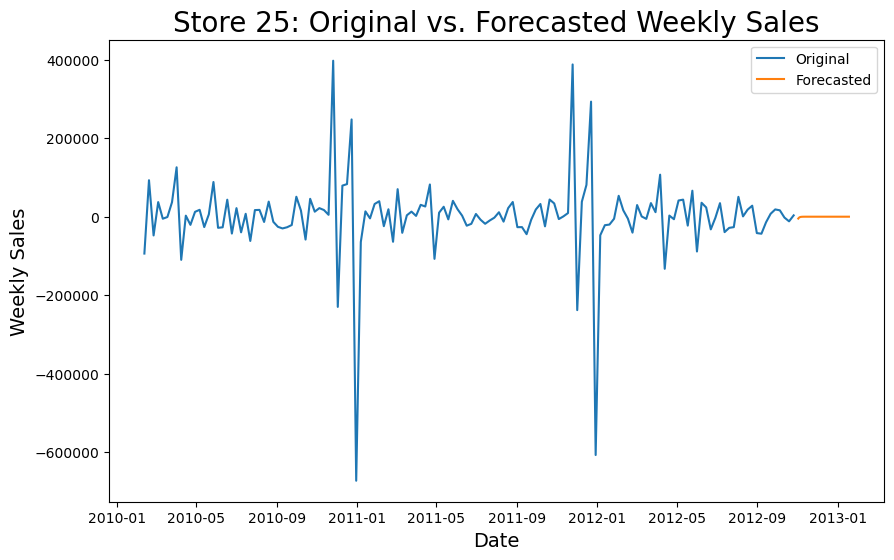

Store 26: Time series is stationary.


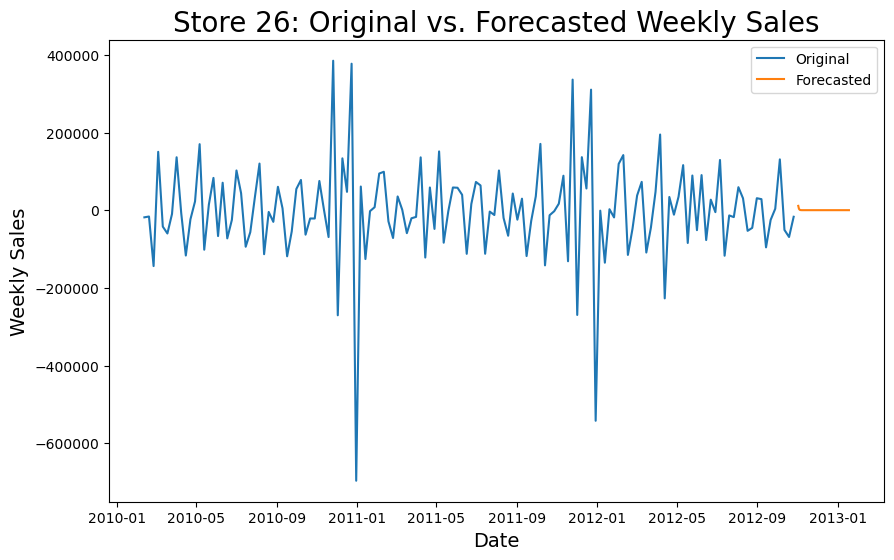

Store 27: Time series is stationary.


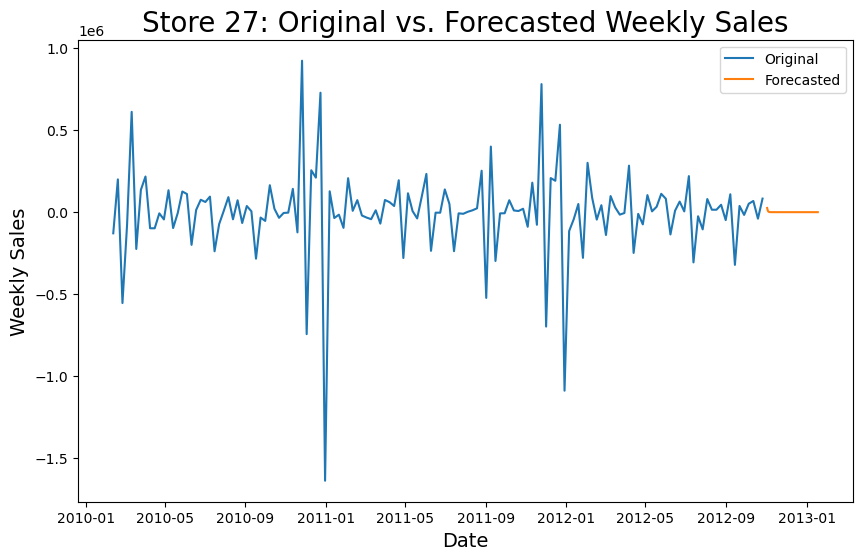

Store 28: Time series is stationary.


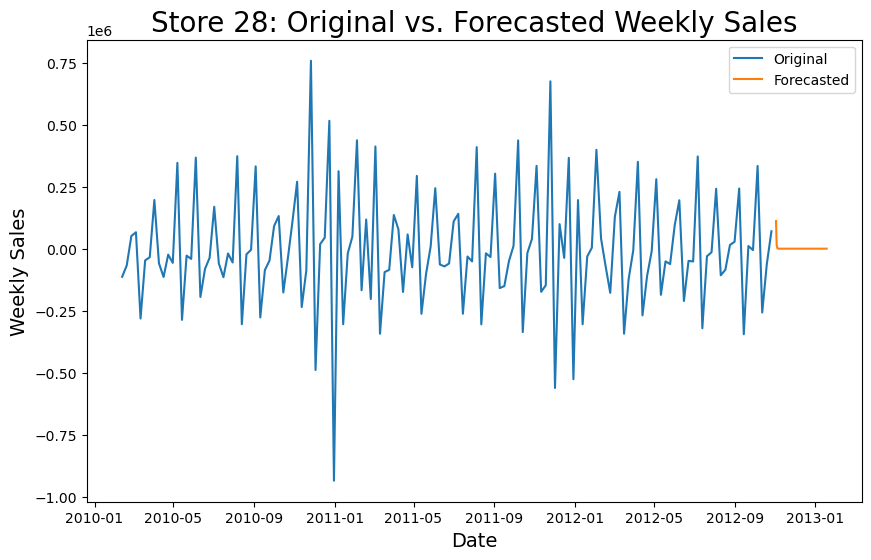

Store 29: Time series is stationary.


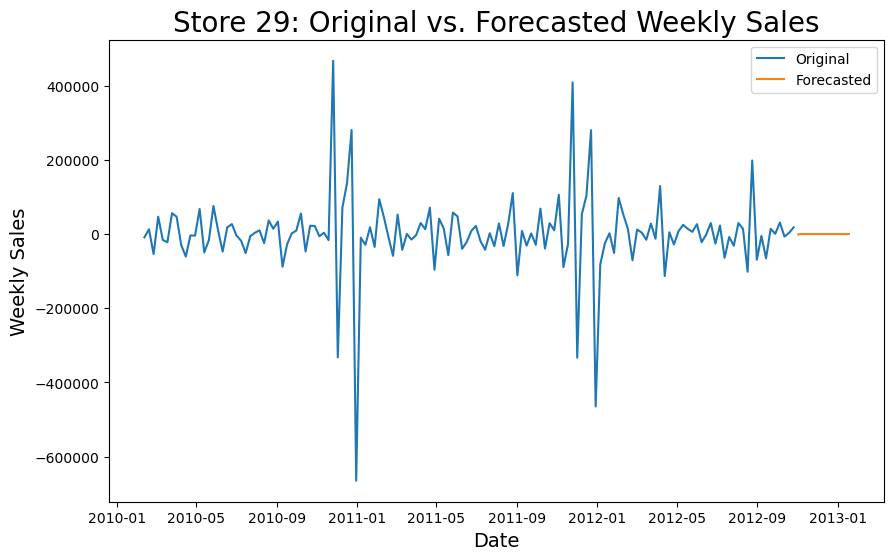

Store 30: Time series is stationary.


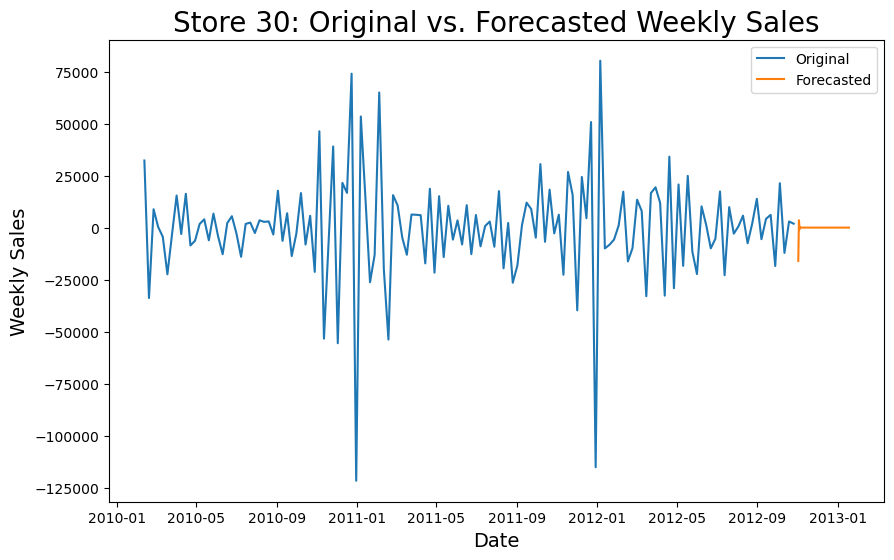

Store 31: Time series is stationary.


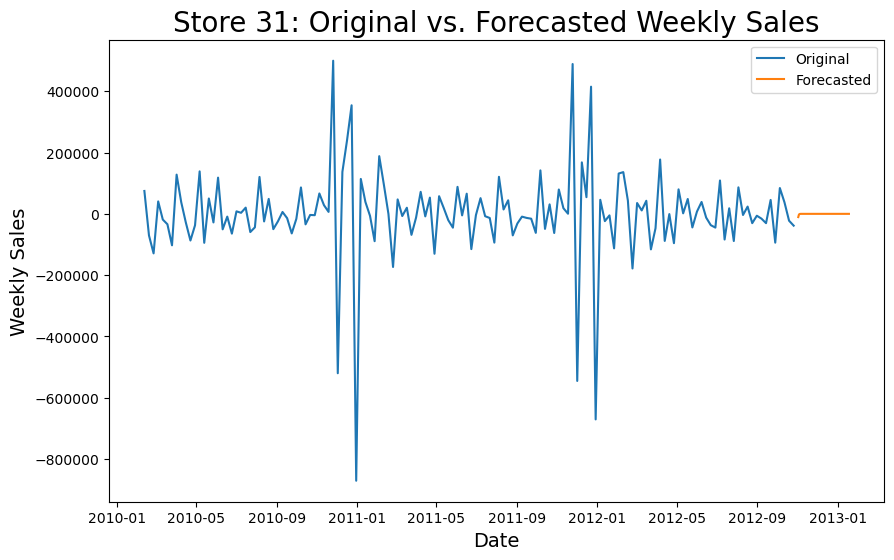

Store 32: Time series is stationary.


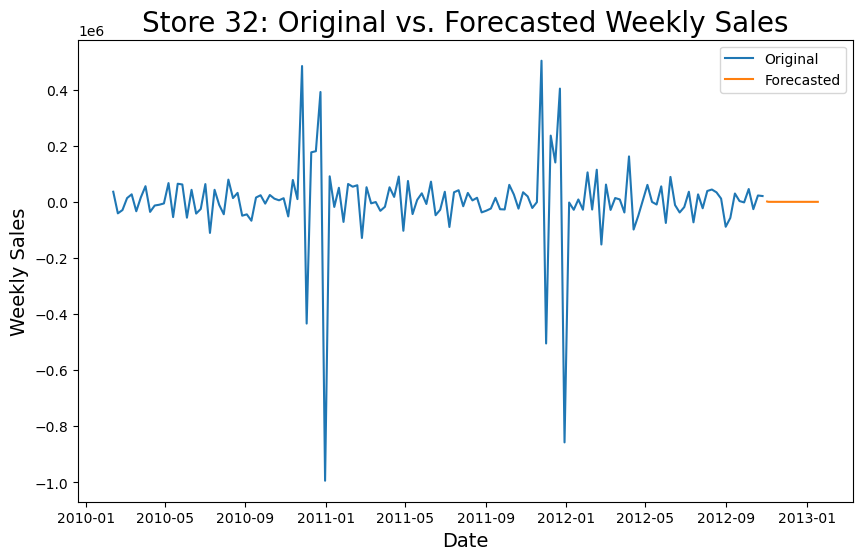

Store 33: Time series is stationary.


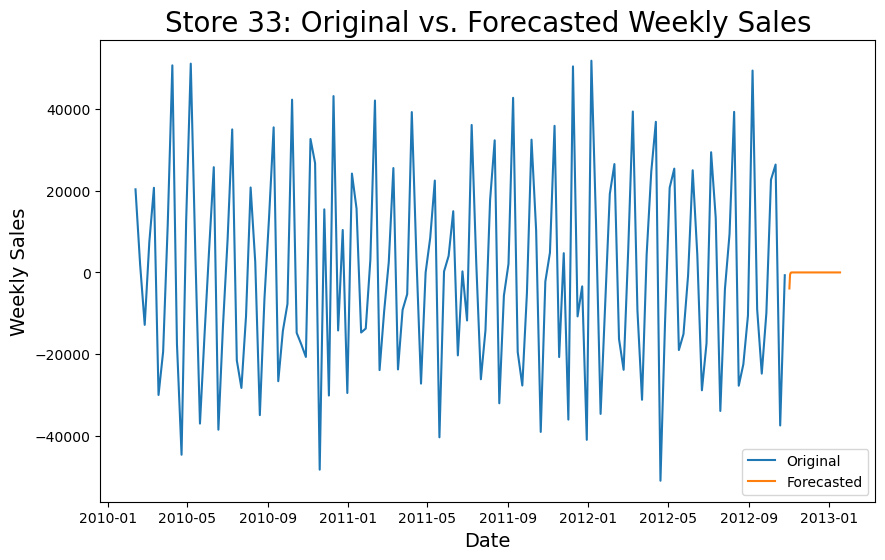

Store 34: Time series is stationary.


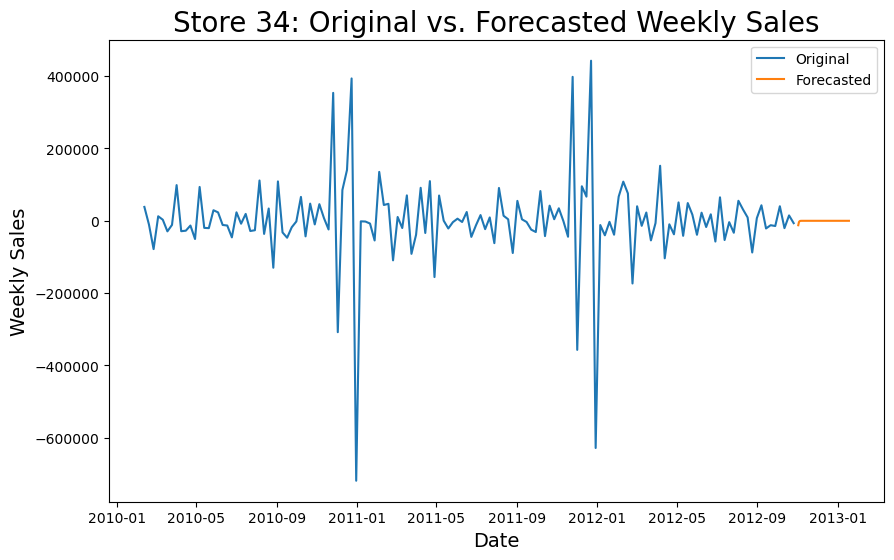

Store 35: Time series is stationary.


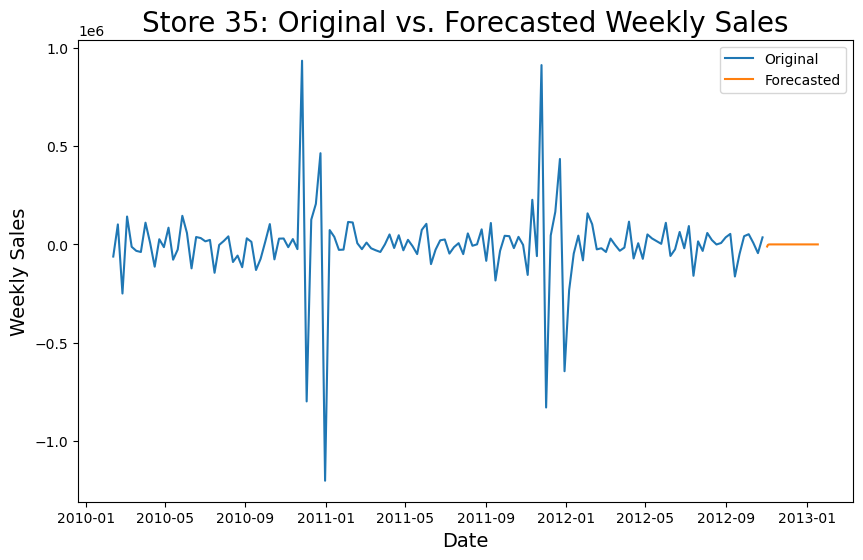

Store 36: Time series is stationary.


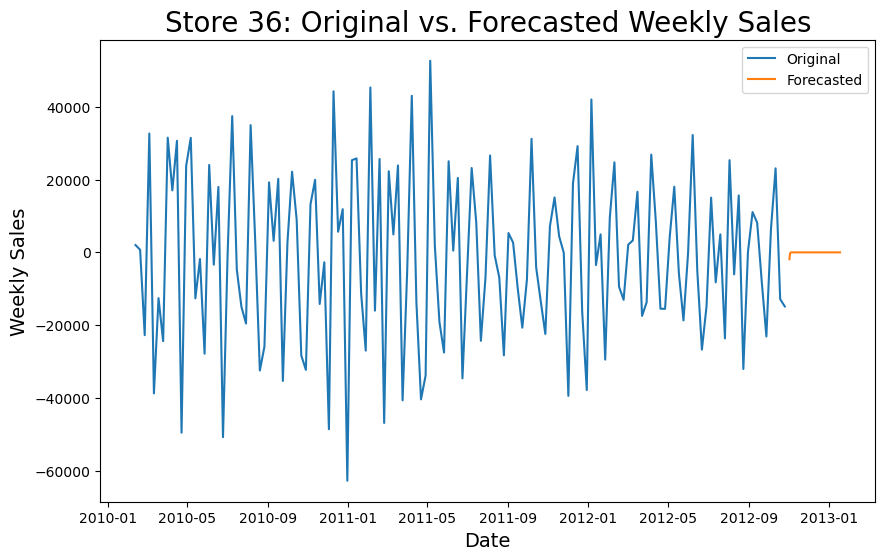

Store 37: Time series is stationary.


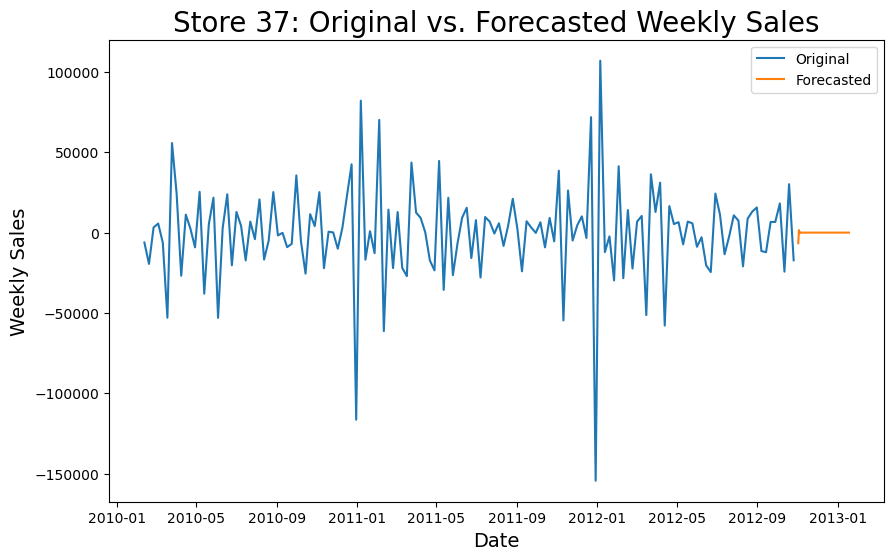

Store 38: Time series is stationary.


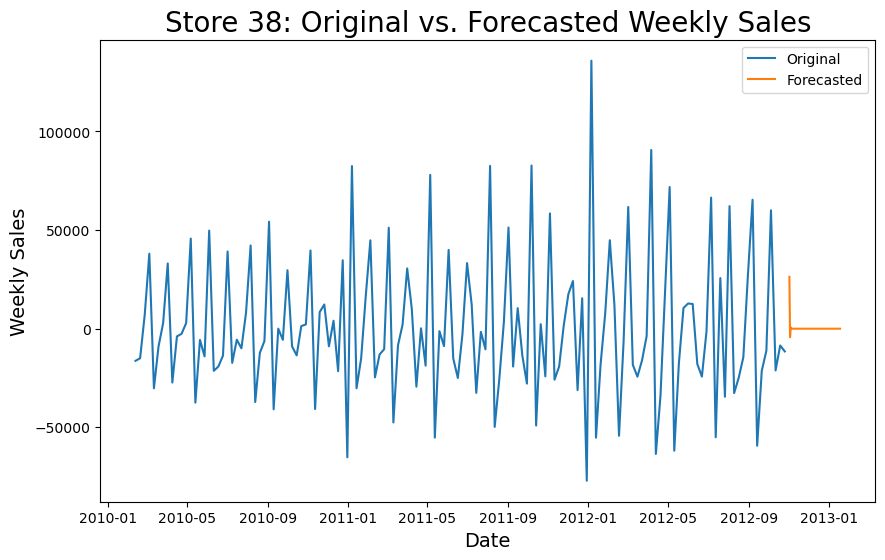

Store 39: Time series is stationary.


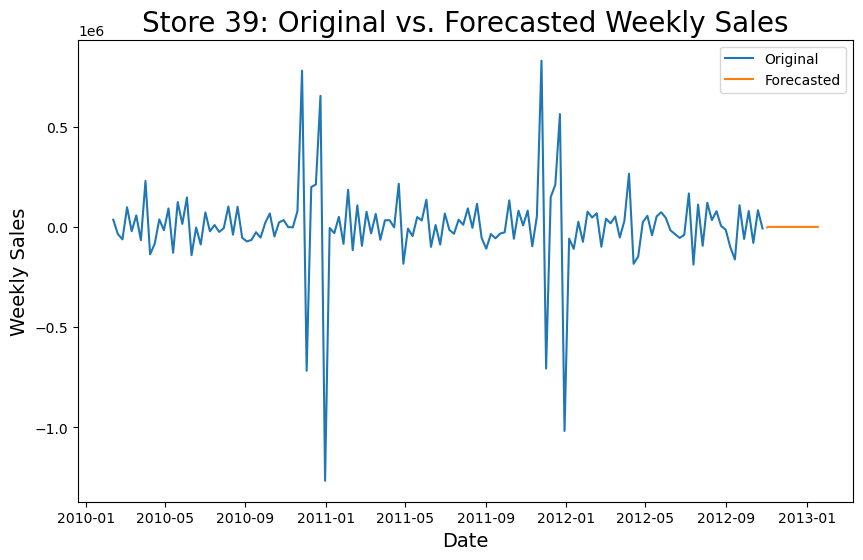

Store 40: Time series is stationary.


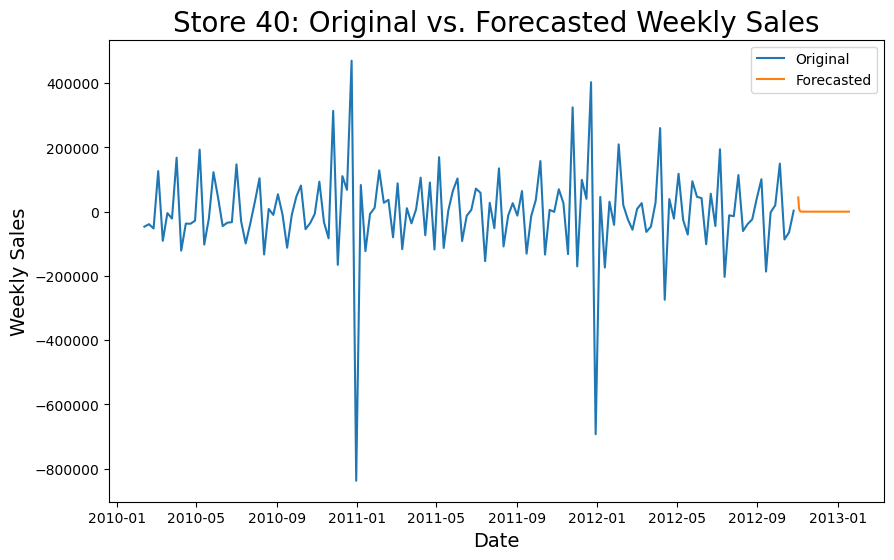

Store 41: Time series is stationary.


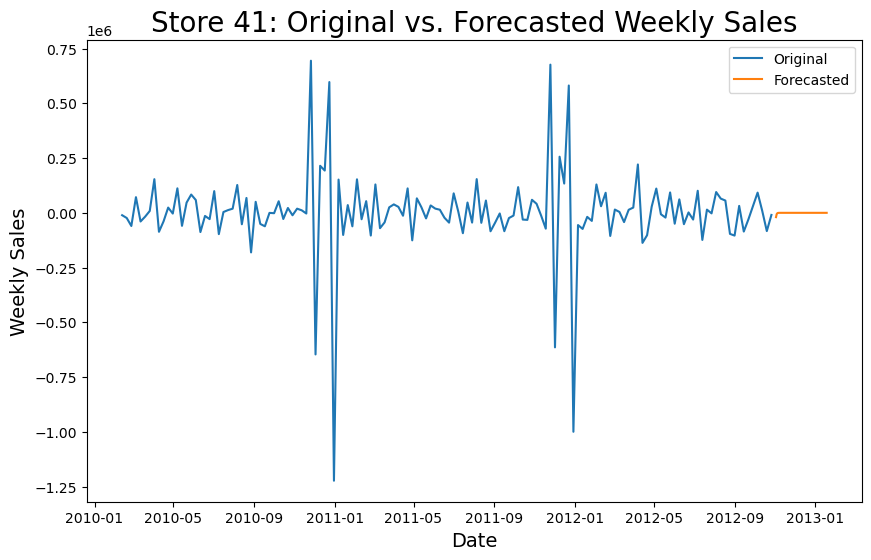

Store 42: Time series is stationary.


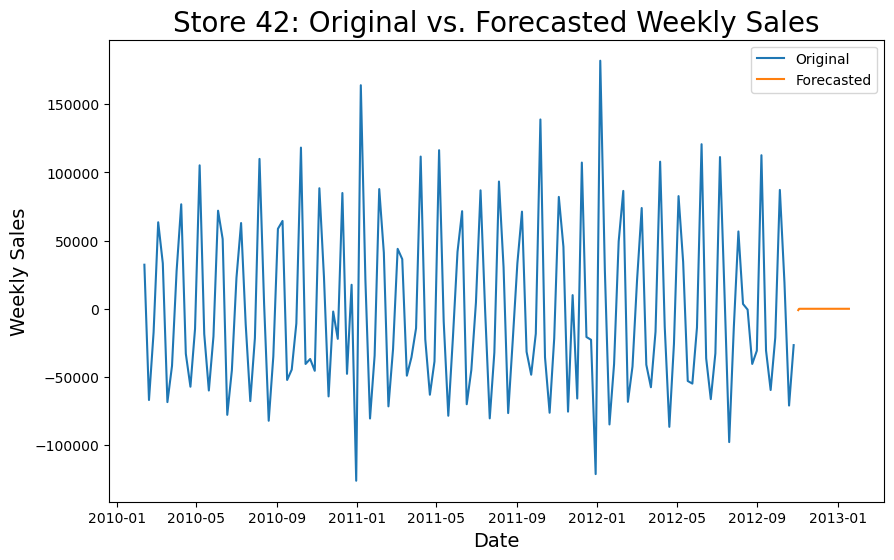

Store 43: Time series is stationary.


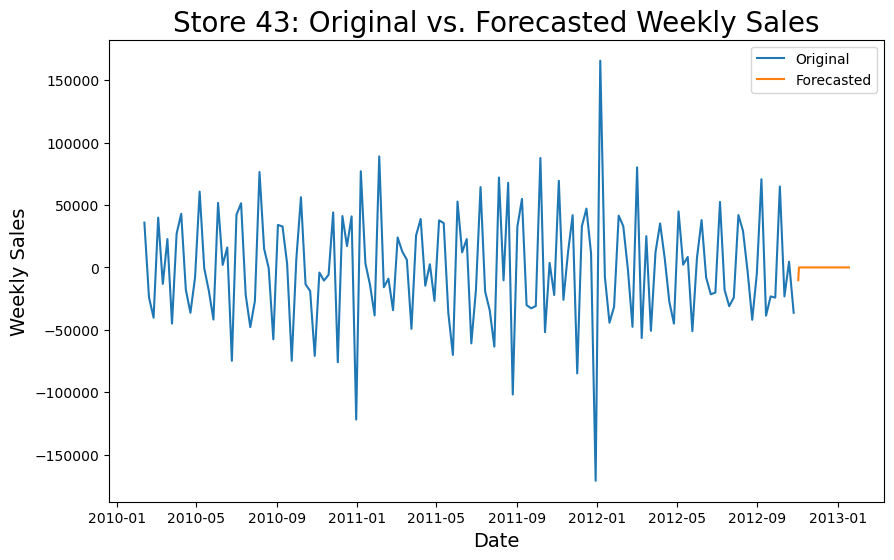

Store 44: Time series is stationary.


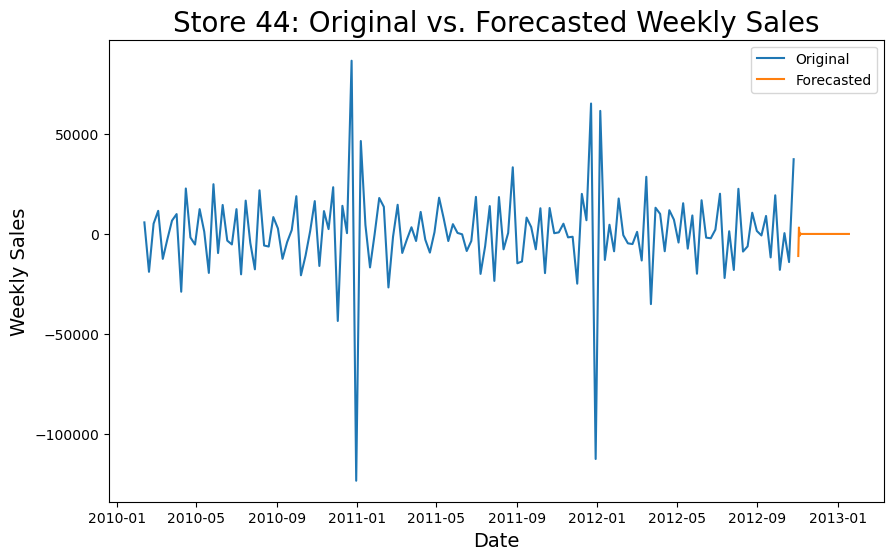

Store 45: Time series is stationary.


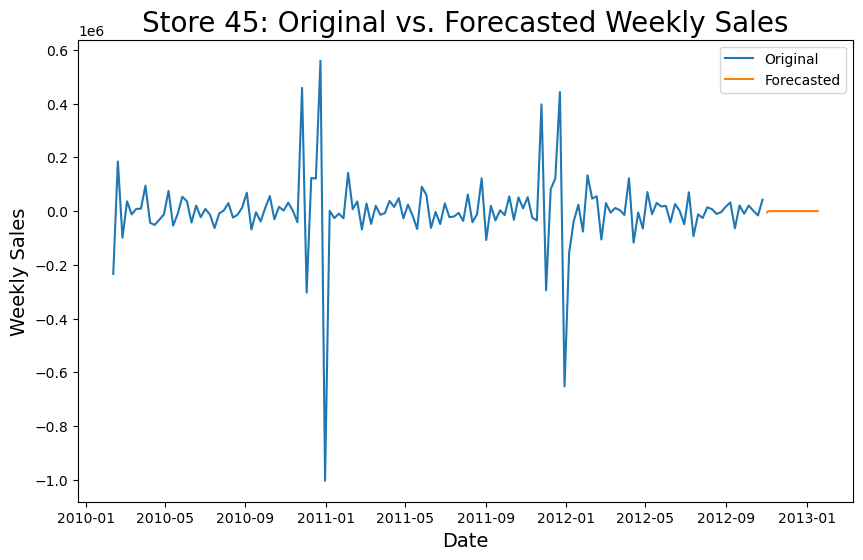

In [126]:
# Get a sorted list of unique store IDs
store_ids = sorted(df['Store'].unique())
def forecast_for_store(sales_data, store_id, num_weeks=12):
    # Preprocess the data
    # sales_data['Date'] = pd.to_datetime(sales_data['Date'], dayfirst=True)
    # sales_data.set_index('Date', inplace=True)
    sales_data['Weekly_Sales_Diff'] = sales_data['Weekly_Sales'] - sales_data['Weekly_Sales'].shift(1)

    result = adfuller(sales_data['Weekly_Sales_Diff'].dropna())
    if result[1] <= 0.05:
        print(f"Store {store_id}: Time series is stationary.")
    else:
        print(f"Store {store_id}: Time series is not stationary. You may need to difference again or apply other transformations.")


    # Train the SARIMAX model with customized order
    train = sales_data.iloc[:120]
    order = (1, 0, 1)  # Customize the order as needed
    model = SARIMAX(train['Weekly_Sales_Diff'], order=order)
    results = model.fit()

    # Forecast for the next 'num_weeks' weeks
    sales_data.index = pd.to_datetime(sales_data.index)
    forecast_start_date = sales_data.index[-1] + pd.DateOffset(weeks=1)  # Start from the next week
    forecast_end_date = forecast_start_date + pd.DateOffset(weeks=11)
    forecast_date_range = pd.date_range(forecast_start_date, forecast_end_date)
    forecast = results.predict(start=len(train), end=len(train) + len(forecast_date_range) - 1)

    # Create a DataFrame for the forecasted data with the appropriate date index
    forecast_df = pd.DataFrame({'Date': forecast_date_range, f'Weekly_Sales_Diff_Forecast_Store{store_id}': forecast})
    forecast_df.set_index('Date', inplace=True)

    # Plot the original and forecasted data
    plt.figure(figsize=(10, 6))
    plt.title(f'Store {store_id}: Original vs. Forecasted Weekly Sales', fontsize=20)
    plt.plot(sales_data['Weekly_Sales_Diff'], label='Original')
    plt.plot(forecast_df[f'Weekly_Sales_Diff_Forecast_Store{store_id}'], label='Forecasted')
    plt.legend(loc='best')
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Weekly Sales', fontsize=14)
    plt.show()

    # Return the forecasted data
    return forecast_df

# 'data' contains the data for all stores and 'Store' is the column with store IDs
for store_id in store_ids:
    sales_data = df[df['Store'] == store_id]
    forecast_for_store(sales_data, store_id)